In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_validate
from sklearn.preprocessing import minmax_scale,StandardScaler
from tqdm import tqdm_notebook
from sklearn.model_selection import TimeSeriesSplit

In [2]:
# os.chdir(r"/raid6/roozbeh/traffic_cam_data/")

In [3]:
os.chdir(r"C:\Users\Roozbeh\Vehicular Data\London")

In [4]:
df = pd.read_csv('AA_LONDON_DATA_VER3_DATA_TABLE.csv')

In [5]:
camdf = pd.read_csv('AA_LONDON_CAMERA_DATA_TABLE.csv')

In [6]:
# os.makedirs("spatio_temporal_London")

In [7]:
os.chdir(r"./spatio_temporal_London/")

In [8]:
df[:2]

,S_NO,CAMERA_NAME,DOWNLOAD_DATE,IMG_NAME,DENSITY_VALUE,DL_TIMESTAMP_LOCAL,COMMENTS,CAMERA_ID,DL_TIMESTAMP_CITY,SELECT_FLAG,RED,GREEN,BLUE
0,896208,549744,22-NOV-10,1290433594,16109.680,22-NOV-10 02.46.34.000000000 PM,NaN,182,22-NOV-10 01.46.34.000000000 PM,1,63621.507812,65366.414062,64108.488281
1,896209,549744,22-NOV-10,1290434044,11318.897,22-NOV-10 02.54.04.000000000 PM,NaN,182,22-NOV-10 01.54.04.000000000 PM,1,64379.992188,66520.500000,65209.515625


In [9]:
camdf[:2]

,CAMERA_ID,CAMERA_NAME,CAMERA_DESC,EASTING,NORTHING,GEO_LAT,GEO_LON,CONGESTION_ZONE
0,105,546600,A4 Cromwell Road by Earls Court Road,525351.39,178843.06,51.494572,-0.195707,0
1,106,546610,A4 Great West Road By Macbeth Street,522781.00,178369.00,51.490875,-0.232884,0


In [10]:
mergedf = df.merge(camdf,left_on="CAMERA_ID",right_on="CAMERA_ID")

tdf = mergedf[["CAMERA_ID","GEO_LON","GEO_LAT","DL_TIMESTAMP_CITY","DENSITY_VALUE"]].copy()

tdf['TIMESTAMP']  = pd.to_datetime(tdf['DL_TIMESTAMP_CITY'],format="%d-%b-%y %I.%M.%S.000000000 %p")

try:
    tdf.drop("DL_TIMESTAMP_CITY",axis=1,inplace=True)
except:
    print("column doesn't exist")

In [11]:
tdf[:2]

,CAMERA_ID,GEO_LON,GEO_LAT,DENSITY_VALUE,TIMESTAMP
0,182,-0.245122,51.616876,16109.680,2010-11-22 13:46:34
1,182,-0.245122,51.616876,11318.897,2010-11-22 13:54:04


In [12]:
tdf["TIME_EPOCH"] = (tdf.TIMESTAMP.astype(np.int64) // 10**9)

In [13]:
tdf["TIME_EPOCH"] -= tdf.TIME_EPOCH.min()

In [14]:
tdf.TIMESTAMP.describe()

count                  896246
unique                 401908
top       2010-10-24 10:17:03
freq                      163
first     2010-10-11 09:55:01
last      2010-11-22 18:59:42
Name: TIMESTAMP, dtype: object

In [15]:
tdf["TIME_BUCKET"] = tdf.TIME_EPOCH//600

In [16]:
tdf[:2]

,CAMERA_ID,GEO_LON,GEO_LAT,DENSITY_VALUE,TIMESTAMP,TIME_EPOCH,TIME_BUCKET
0,182,-0.245122,51.616876,16109.680,2010-11-22 13:46:34,3642693,6071
1,182,-0.245122,51.616876,11318.897,2010-11-22 13:54:04,3643143,6071


In [17]:
yscaler = StandardScaler()

In [18]:
yscaler.fit(tdf["DENSITY_VALUE"].values.reshape((-1,1)))

StandardScaler(copy=True, with_mean=True, with_std=True)

In [19]:
tdf.loc[:,"SCALED_DENSITY_VALUE"] = yscaler.transform(tdf["DENSITY_VALUE"].values.reshape((-1,1)))

In [20]:
tdf[:2]

,CAMERA_ID,GEO_LON,GEO_LAT,DENSITY_VALUE,TIMESTAMP,TIME_EPOCH,TIME_BUCKET,SCALED_DENSITY_VALUE
0,182,-0.245122,51.616876,16109.680,2010-11-22 13:46:34,3642693,6071,-0.459432
1,182,-0.245122,51.616876,11318.897,2010-11-22 13:54:04,3643143,6071,-0.906670


In [21]:
Xfeatures = ["GEO_LON","GEO_LAT"]
Tfeature = "TIME_EPOCH"
target = "SCALED_DENSITY_VALUE"

In [22]:
from pandas.plotting import autocorrelation_plot

In [23]:
tdf_10min = tdf.groupby(["CAMERA_ID",pd.Grouper(key="TIMESTAMP",freq='10min')]).mean()

In [24]:
tdf_1min = tdf.groupby(["CAMERA_ID",pd.Grouper(key="TIMESTAMP",freq='1min')]).mean()

In [25]:
tdf_30min = tdf.groupby(["CAMERA_ID",pd.Grouper(key="TIMESTAMP",freq='30min')]).mean()

In [26]:
tdf_1h = tdf.groupby(["CAMERA_ID",pd.Grouper(key="TIMESTAMP",freq='1H')]).mean()

In [27]:
tdf_10min.TIME_EPOCH = tdf_10min.TIME_EPOCH.astype(np.int64)
tdf_10min.TIME_BUCKET = tdf_10min.TIME_BUCKET.astype(np.int64)

In [28]:
tdf_1min.TIME_EPOCH = tdf_1min.TIME_EPOCH.astype(np.int64)
tdf_1min.TIME_BUCKET = tdf_1min.TIME_BUCKET.astype(np.int64)

In [29]:
tdf_30min.TIME_EPOCH = tdf_30min.TIME_EPOCH.astype(np.int64)
tdf_30min.TIME_BUCKET = tdf_30min.TIME_BUCKET.astype(np.int64)

In [30]:
tdf_1h.TIME_EPOCH = tdf_1h.TIME_EPOCH.astype(np.int64)
tdf_1h.TIME_BUCKET = tdf_1h.TIME_BUCKET.astype(np.int64)

In [31]:
tdf_10min[:5]

GEO_LON    GEO_LAT  DENSITY_VALUE  TIME_EPOCH  \
CAMERA_ID TIMESTAMP                                                             
1         2010-10-11 09:50:00 -0.218065  51.481782     51667.9180          90   
          2010-10-11 10:00:00 -0.218065  51.481782     39100.7650         720   
          2010-10-11 10:10:00 -0.218065  51.481782     45671.0210        1440   
          2010-10-11 10:20:00 -0.218065  51.481782     45811.2860        1710   
          2010-10-11 10:30:00 -0.218065  51.481782     49308.1445        2340   

                               TIME_BUCKET  SCALED_DENSITY_VALUE  
CAMERA_ID TIMESTAMP                                               
1         2010-10-11 09:50:00            0              2.860066  
          2010-10-11 10:00:00            1              1.686874  
          2010-10-11 10:10:00            2              2.300232  
          2010-10-11 10:20:00            2              2.313327  
          2010-10-11 10:30:00            3              2.639772

In [32]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler,StandardScaler

In [33]:
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from math import sqrt

Using TensorFlow backend.


In [ ]:
# date-time parsing function for loading the dataset
# def parser(x):
# 	return datetime.strptime('190'+x, '%Y-%m')

In [34]:
# frame a sequence as a supervised learning problem
def timeseries_to_supervised(data, lag=1):
    df = pd.DataFrame(data)
    columns = [df.shift(i) for i in range(1, lag+1)]
    columns.append(df)
    df = pd.concat(columns, axis=1)
    df.fillna(0, inplace=True)
    return df

In [35]:
timeseries_to_supervised(tdf_30min)["SCALED_DENSITY_VALUE"][:2]

SCALED_DENSITY_VALUE  SCALED_DENSITY_VALUE
CAMERA_ID TIMESTAMP                                                      
1         2010-10-11 09:30:00              0.000000              2.860066
          2010-10-11 10:00:00              2.860066              2.153440

In [36]:
tdf_30min[:2]

GEO_LON    GEO_LAT  DENSITY_VALUE  TIME_EPOCH  \
CAMERA_ID TIMESTAMP                                                             
1         2010-10-11 09:30:00 -0.218065  51.481782     51667.9180          90   
          2010-10-11 10:00:00 -0.218065  51.481782     44098.5895        1395   

                               TIME_BUCKET  SCALED_DENSITY_VALUE  
CAMERA_ID TIMESTAMP                                               
1         2010-10-11 09:30:00            0              2.860066  
          2010-10-11 10:00:00            2              2.153440

In [37]:
# create a differenced series
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return pd.Series(diff)

In [38]:
# invert differenced value
def inverse_difference(history, yhat, interval=1):
    return yhat + history[-interval]

In [39]:
# scale train and test data to [-1, 1]
def scale(train, test):
    # fit scaler
#     scaler = MinMaxScaler(feature_range=(-1, 1))
    scaler = StandardScaler()
    scaler = scaler.fit(train)
    
    # transform train
    train = train.reshape(train.shape[0], train.shape[1])
    train_scaled = scaler.transform(train)
    # transform test
    test = test.reshape(test.shape[0], test.shape[1])
    test_scaled = scaler.transform(test)
    return scaler, train_scaled, test_scaled

In [40]:
# inverse scaling for a forecasted value
def invert_scale(scaler, X, value):
    new_row = [x for x in X] + [value]
    array = np.array(new_row)
    array = array.reshape(1, len(array))
    inverted = scaler.inverse_transform(array)
    return inverted[0, -1]

In [41]:
# fit an LSTM network to training data
def fit_lstm(train, batch_size, nb_epoch, neurons):
    X, y = train[:, 0:-1], train[:, -1]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    model = Sequential()
    model.add(LSTM(neurons, batch_input_shape=(batch_size, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    for i in range(nb_epoch):
        model.fit(X, y, epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
    return model

In [42]:
# make a one-step forecast
def forecast_lstm(model, batch_size, X):
    X = X.reshape(1, 1, len(X))
    yhat = model.predict(X, batch_size=batch_size)
    return yhat[0,0]

In [43]:
tdf_30min[:2]

GEO_LON    GEO_LAT  DENSITY_VALUE  TIME_EPOCH  \
CAMERA_ID TIMESTAMP                                                             
1         2010-10-11 09:30:00 -0.218065  51.481782     51667.9180          90   
          2010-10-11 10:00:00 -0.218065  51.481782     44098.5895        1395   

                               TIME_BUCKET  SCALED_DENSITY_VALUE  
CAMERA_ID TIMESTAMP                                               
1         2010-10-11 09:30:00            0              2.860066  
          2010-10-11 10:00:00            2              2.153440

In [44]:
tscv = TimeSeriesSplit(n_splits=4)

In [49]:
rmse_per_cam_per_halfhour_df = pd.DataFrame(columns=["camera_id","rmse_f1","rmse_f2","rmse_f3","rmse_f4"])
rmse_scaled_per_cam_per_halfhour_df = pd.DataFrame(columns=["camera_id","rmse_f1","rmse_f2","rmse_f3","rmse_f4"])

In [50]:
rmse_scaled_per_cam_per_halfhour_df

,camera_id,rmse_f1,rmse_f2,rmse_f3,rmse_f4


#### TODO: Because of randomness of initial values, it seems that same model needs to be run several times and the best one then will be picked.

HBox(children=(IntProgress(value=0, max=178), HTML(value='')))

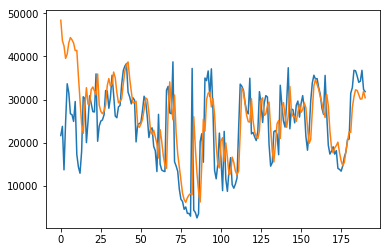

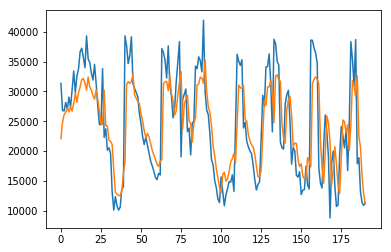

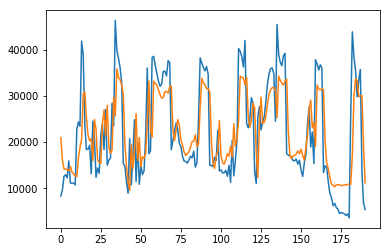

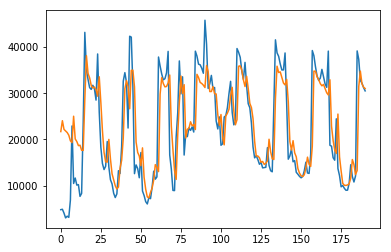

[1, 0.6702765283335824, 0.5271222156705914, 0.7311240390735004, 0.7041072961718776]


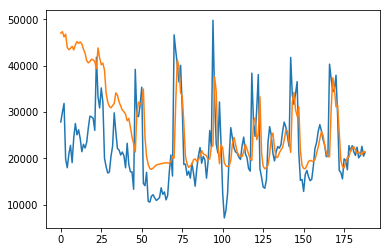

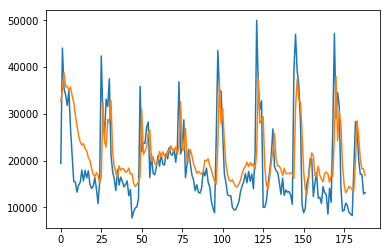

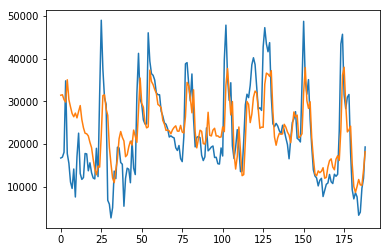

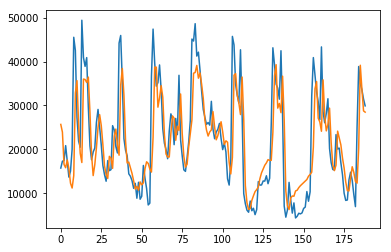

[2, 1.1032315511929227, 0.8641879659573476, 0.8824425174579832, 0.8621248603042009]


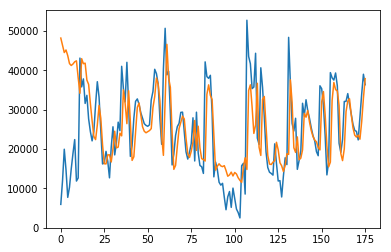

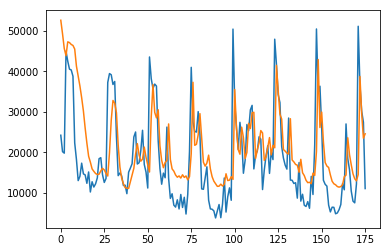

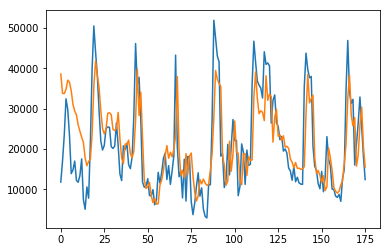

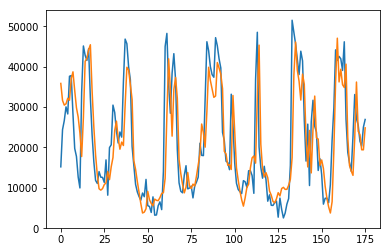

[3, 0.8603032819973238, 0.865358003970925, 0.6951038743376596, 0.7253219409615687]


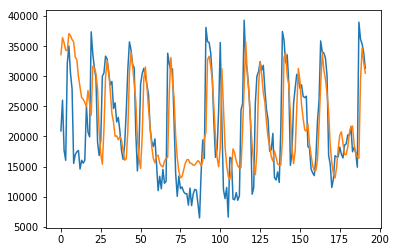

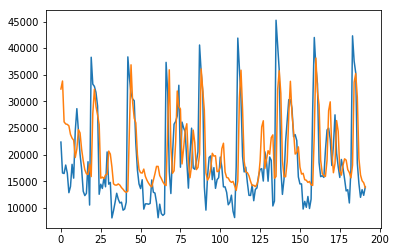

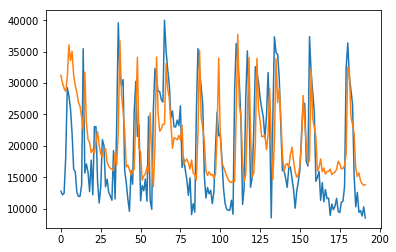

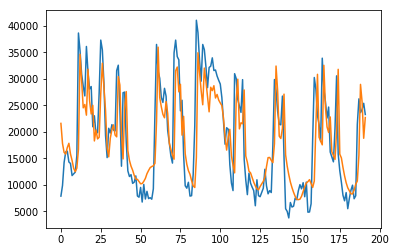

[4, 0.7219575071344249, 0.838788121941067, 0.8031875685539096, 0.718345713694785]


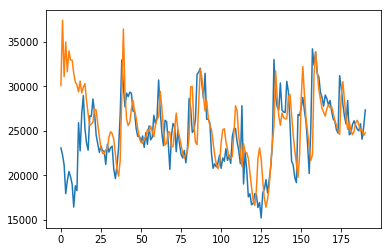

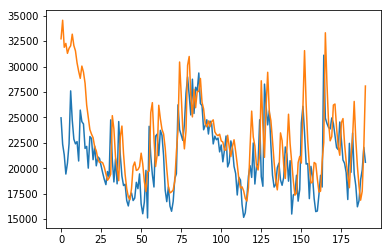

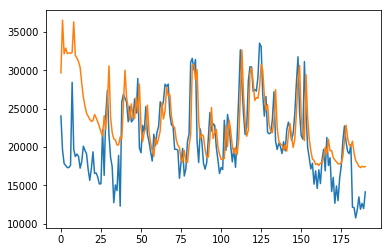

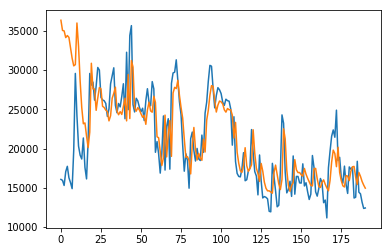

[5, 0.7431945110218451, 0.7986513044713751, 1.0511408271553082, 0.9833243052873534]


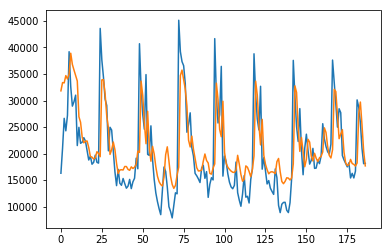

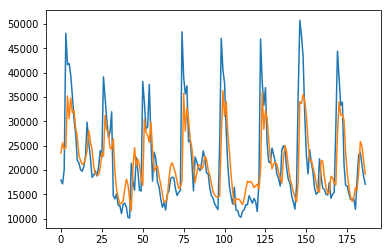

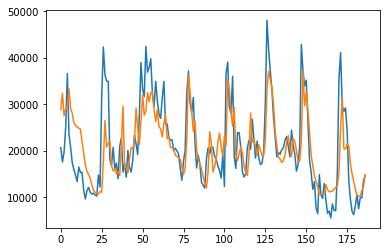

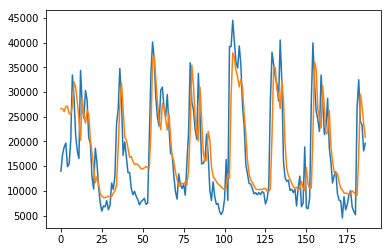

[6, 0.7004954083313536, 0.7427372198244618, 0.7382430835359993, 0.7306323516573889]


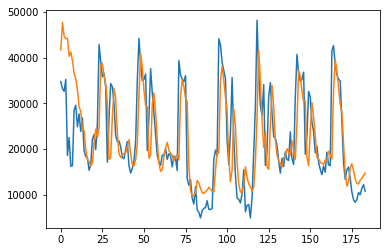

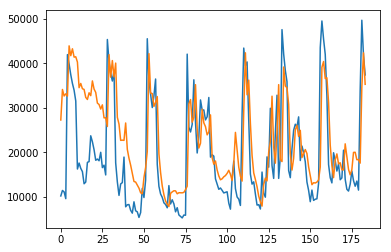

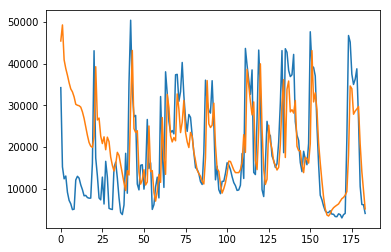

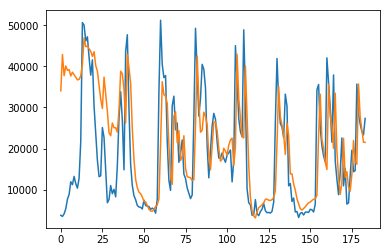

[7, 0.6543061913864928, 0.8772142287848987, 0.9998858105703289, 1.056696200471041]


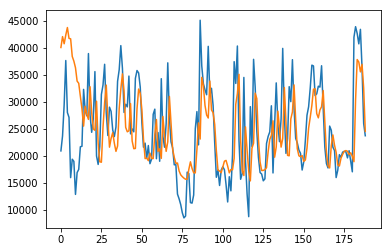

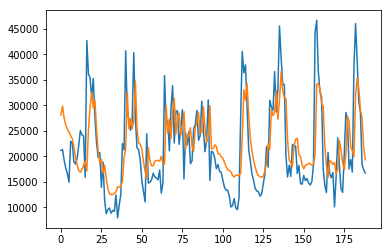

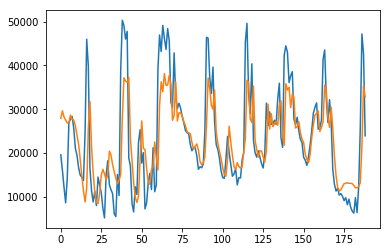

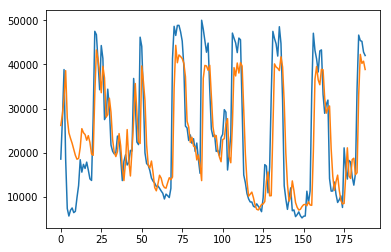

[8, 0.773053732502002, 0.7018641409171713, 0.9032035568445543, 0.8582335960297376]


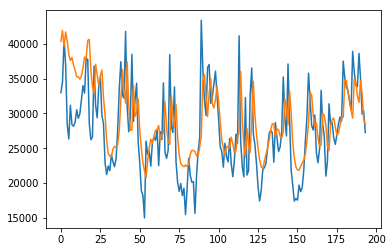

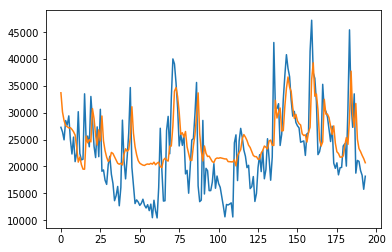

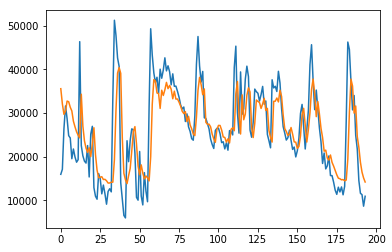

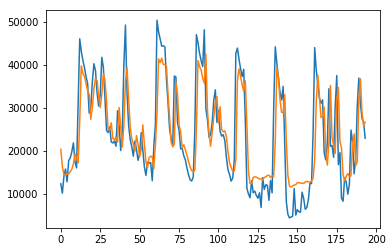

[9, 0.6167814808373212, 0.8469393543161255, 0.9609643871752405, 0.81784064998965]


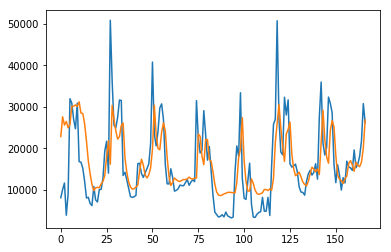

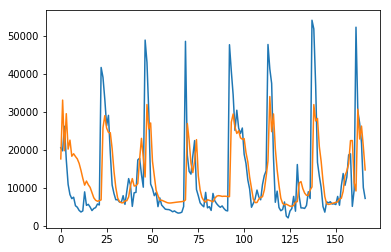

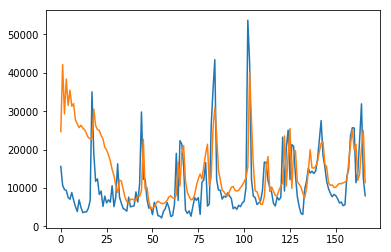

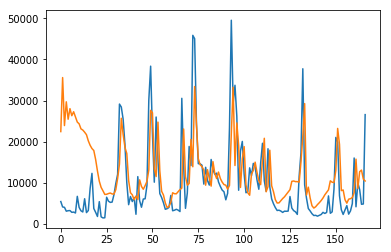

[10, 0.7855108299340396, 1.0485695127986678, 0.9643078697177297, 0.9591201065578184]


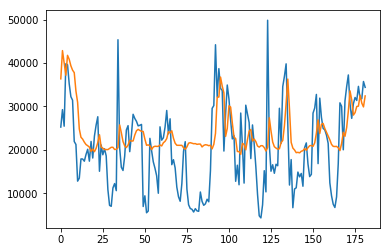

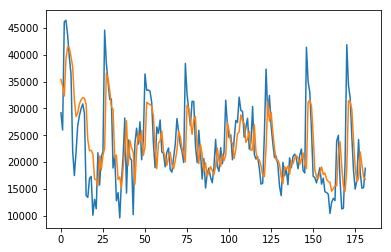

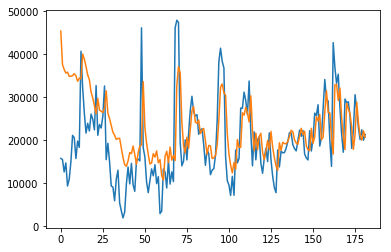

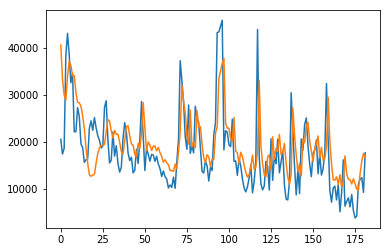

[11, 1.0575367638300641, 0.6127249230352642, 1.019231552891827, 0.7301442079191381]


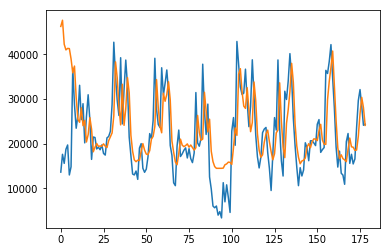

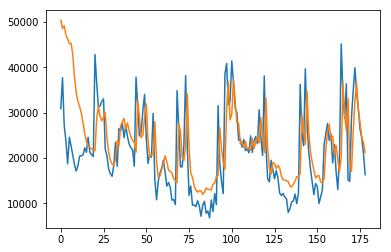

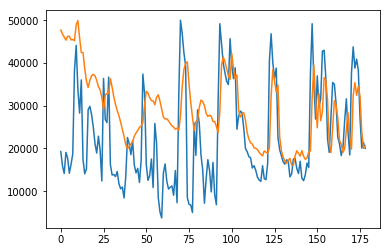

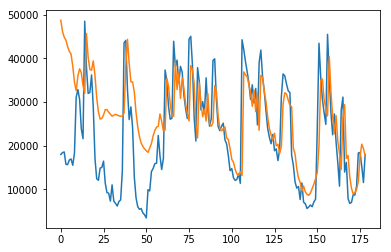

[12, 0.6887845917179855, 0.7849367249611535, 1.2879620375140357, 1.057369281924688]


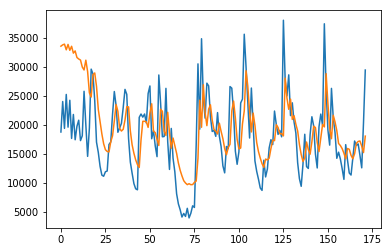

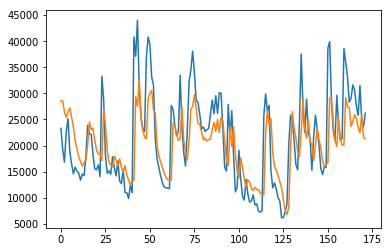

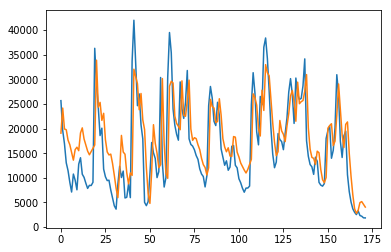

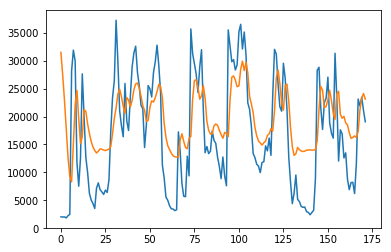

[13, 0.7857278961934919, 0.8530719125579138, 0.8021153047026848, 1.0027805454712106]


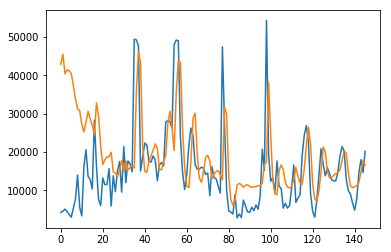

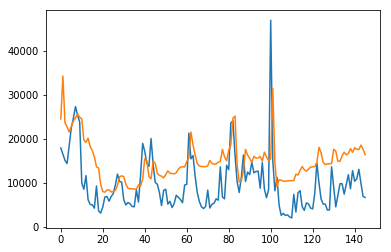

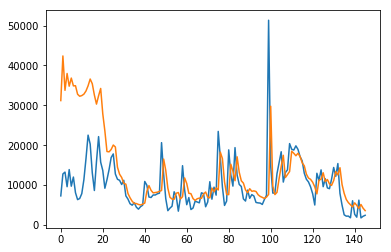

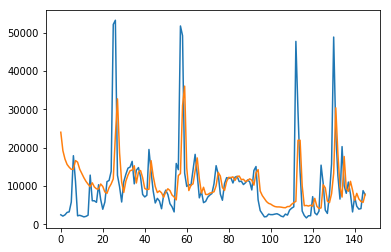

[14, 0.9461516681501778, 0.6011795250937503, 0.8637795192488689, 0.8672358845891933]


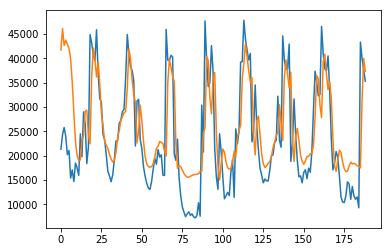

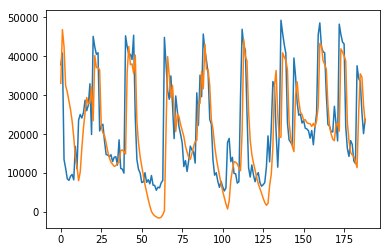

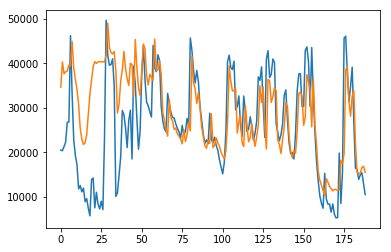

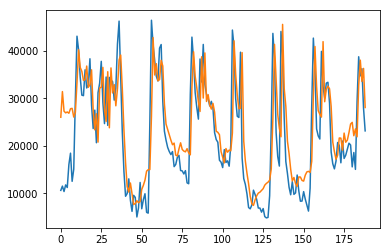

[15, 0.7725577392404817, 0.8876905387933102, 0.9051963375898142, 0.6294791711680486]


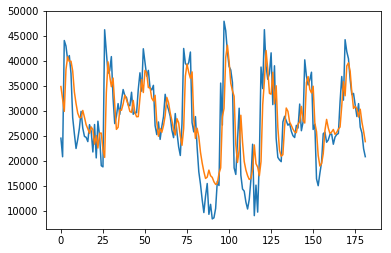

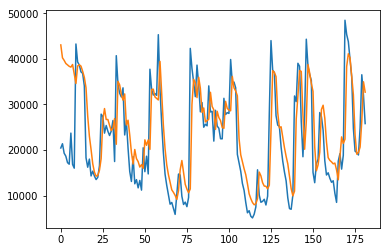

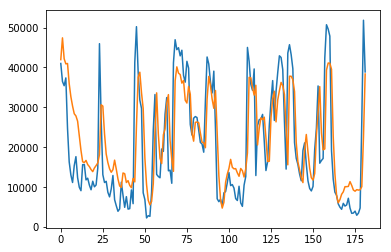

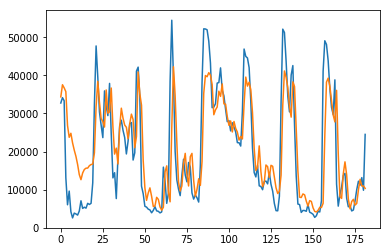

[16, 0.6333962996433886, 0.8845337991568766, 0.9335163370883903, 0.7798813923013993]


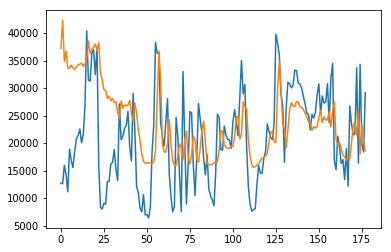

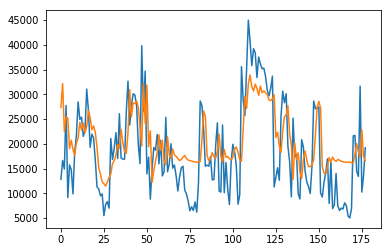

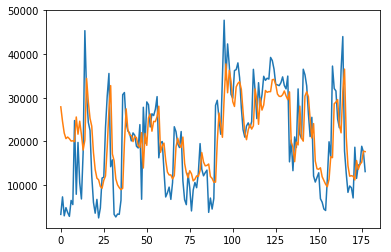

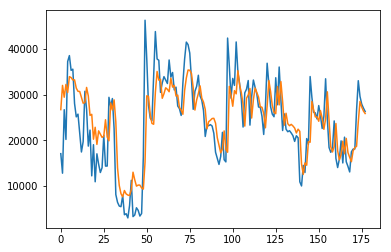

[17, 1.0582911203002534, 0.8522718991662127, 0.9471129928585683, 0.6680898743834214]


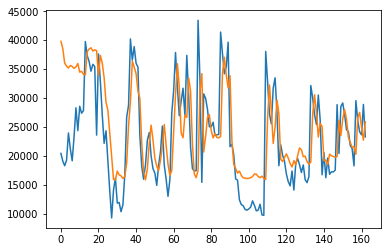

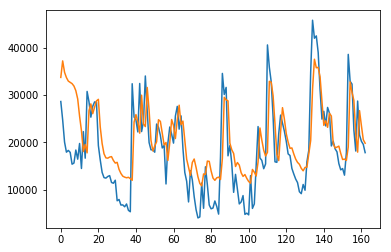

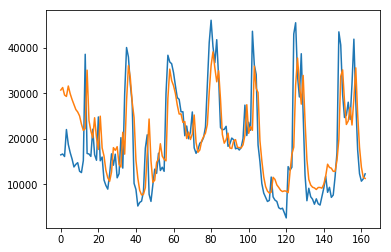

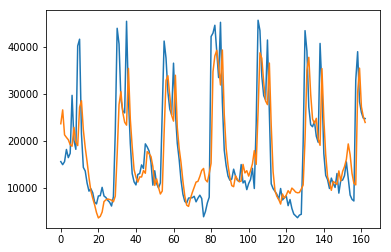

[18, 0.7309211489141005, 0.7809981197693665, 0.788189209887852, 0.7684162031076246]


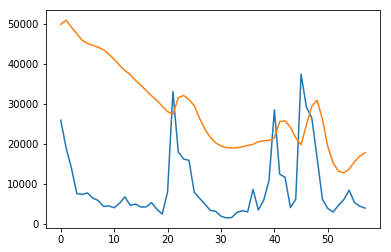

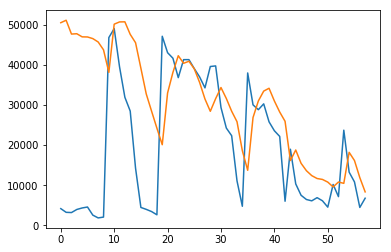

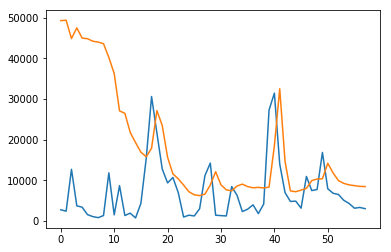

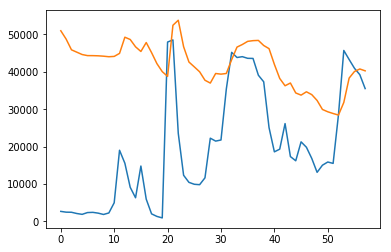

[19, 1.8144490511442963, 1.7115267611947242, 1.4475894814205579, 2.127485595184215]


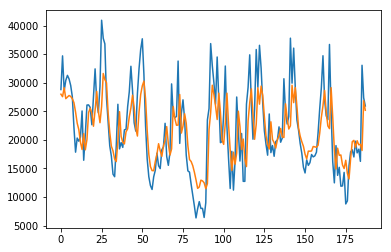

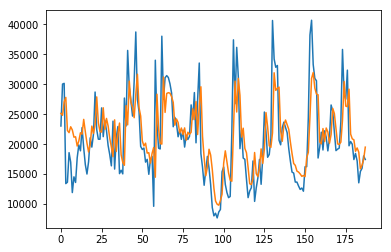

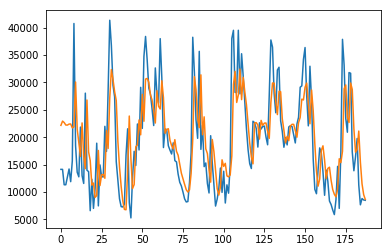

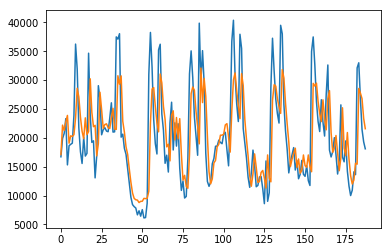

[20, 0.6387798729448554, 0.6694398042981808, 0.8823581650821716, 0.764965939286468]


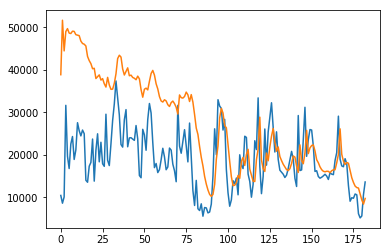

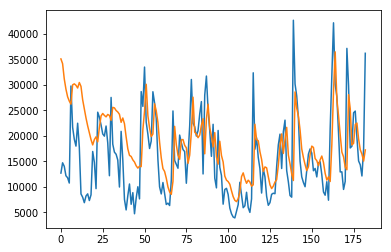

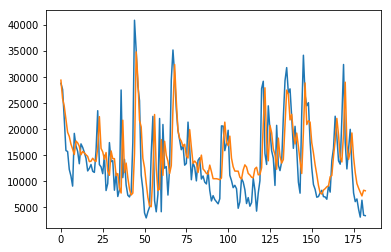

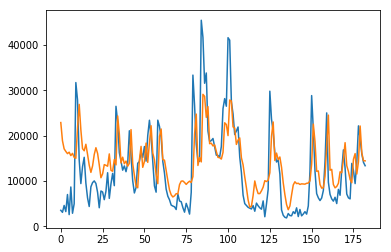

[21, 1.5299832601853893, 1.0396864026900825, 0.767066096405741, 0.873228554328643]


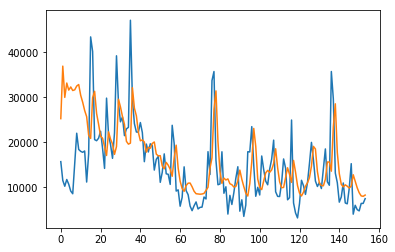

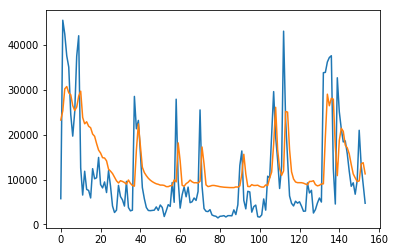

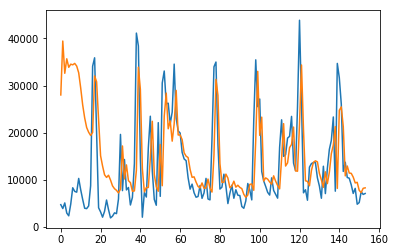

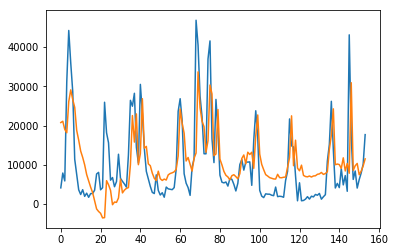

[22, 0.7426173937450511, 0.8318195846835346, 1.0477319688694158, 0.8136929479406428]


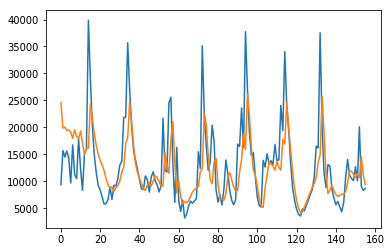

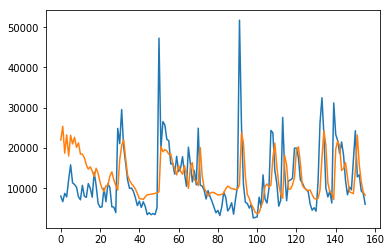

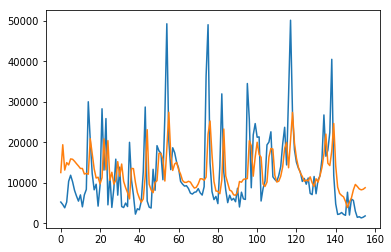

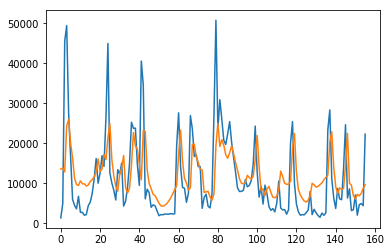

[23, 0.7867354621818624, 1.0404977607445738, 1.106263205490375, 1.0063442067339936]


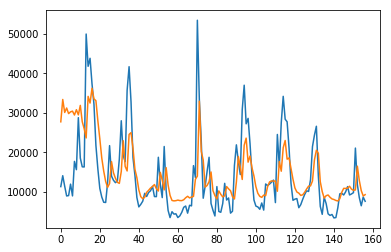

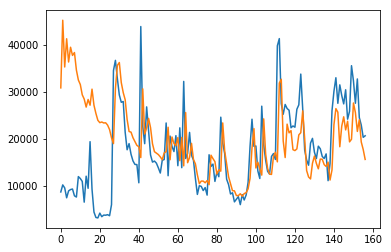

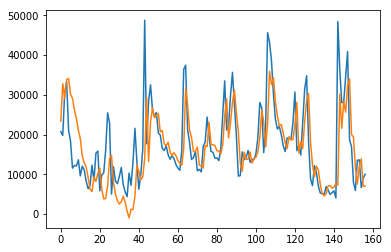

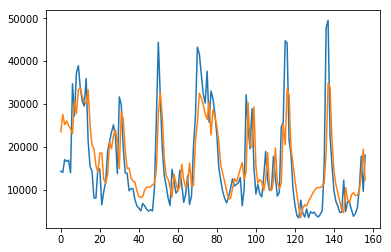

[24, 1.0010178002914252, 1.2275749995087466, 0.8676929283664709, 0.7546291811270145]


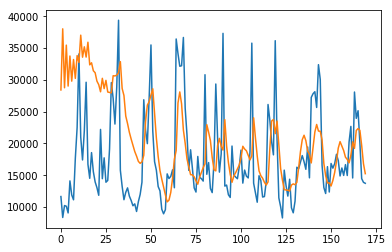

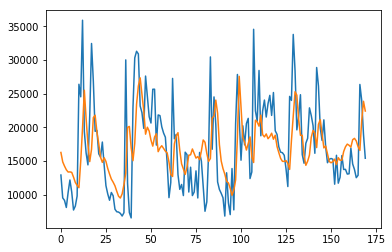

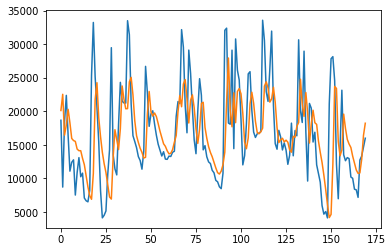

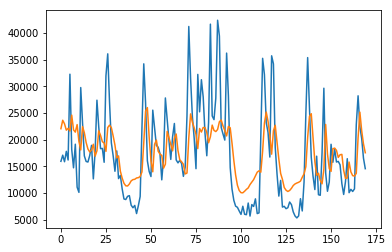

[25, 1.0568018549526568, 0.7506533043511783, 0.8774893142545482, 0.935991536418847]


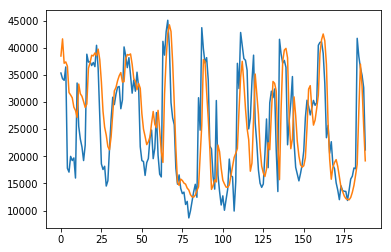

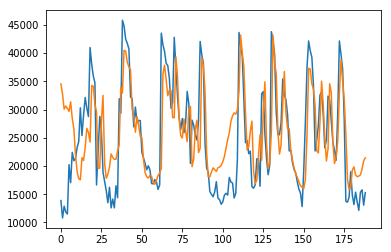

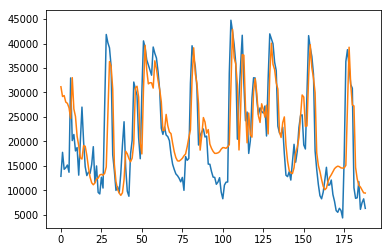

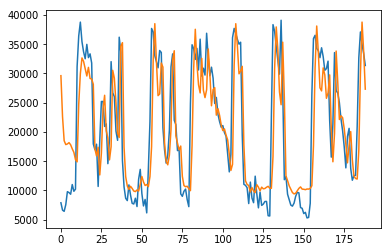

[26, 0.6234042168211945, 0.6576774578163861, 0.6598436242588098, 0.6676960378920344]


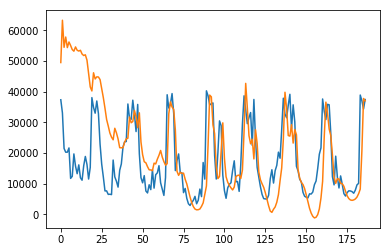

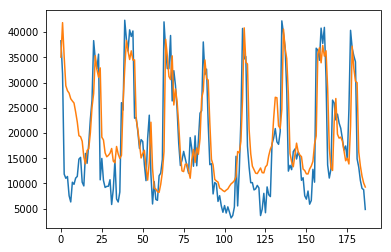

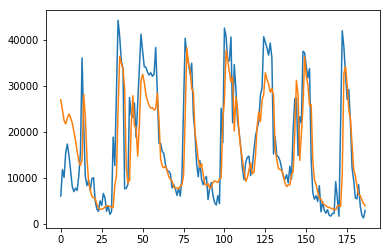

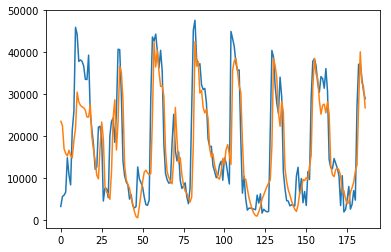

[27, 1.225585912316337, 0.6476648060258494, 0.6417940160924639, 0.6769554223426959]


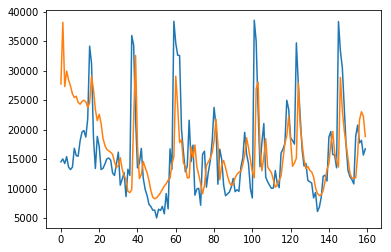

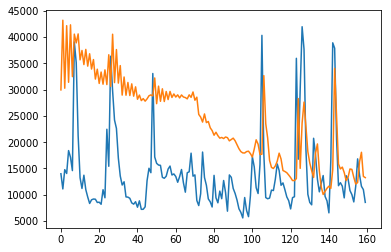

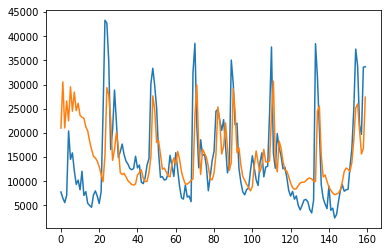

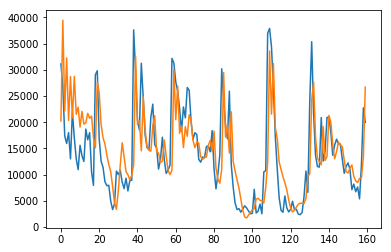

[28, 0.7791707229484841, 1.7716061419400333, 1.0260978301352905, 0.7986983953719834]


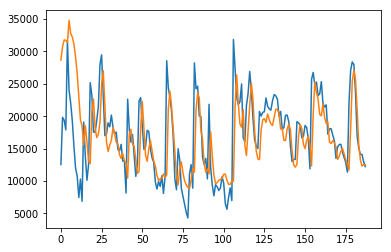

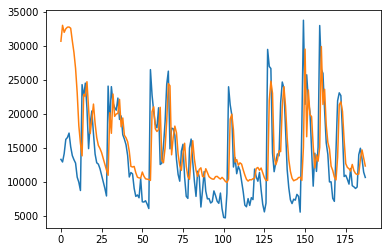

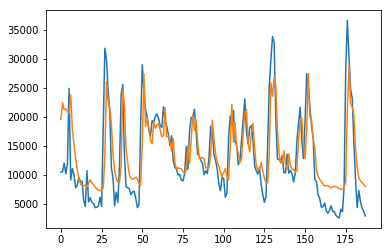

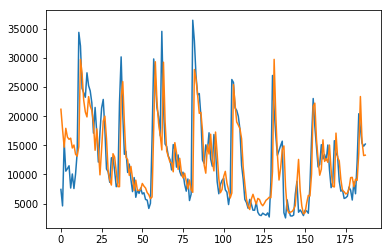

[30, 0.740793698904624, 0.8878667220133734, 0.7379916931867234, 0.7557067329360809]


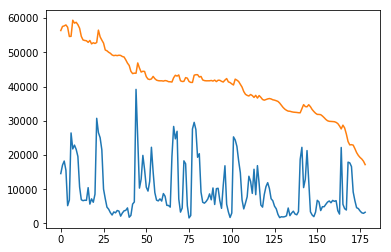

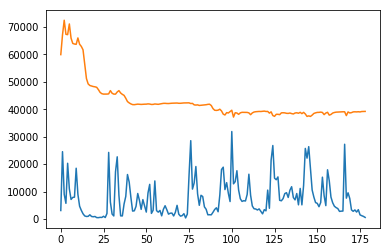

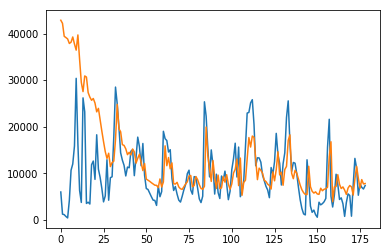

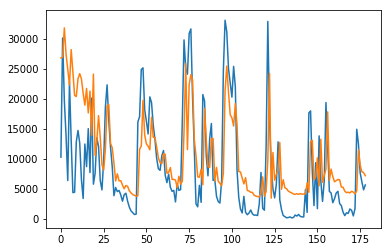

[31, 3.2677485894935523, 3.7140359869953437, 1.0773688087000353, 0.7720649775406107]


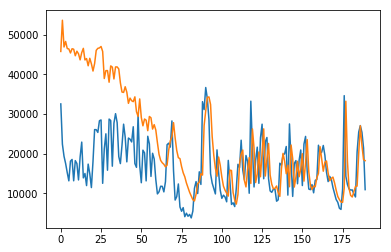

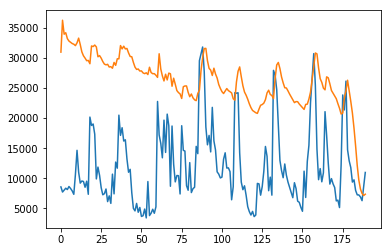

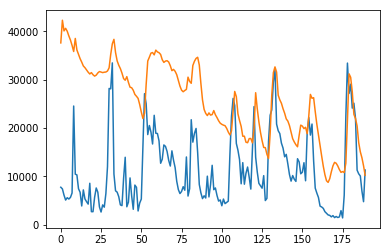

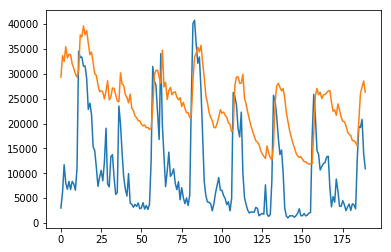

[32, 1.4977297560751341, 1.9616115608203704, 2.228208217268526, 1.961362046110395]


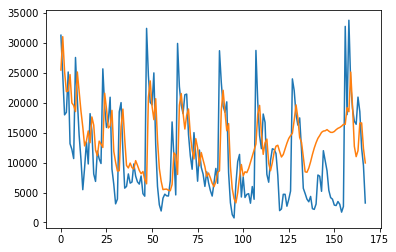

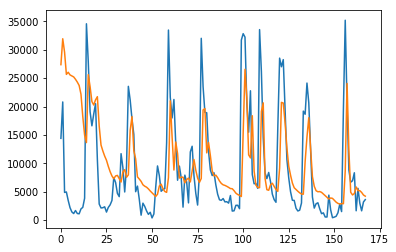

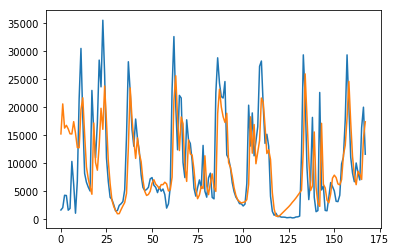

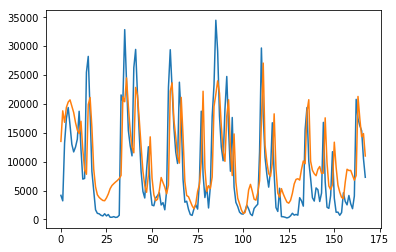

[33, 0.6608537038465626, 0.9846490859045222, 0.7094992331338813, 0.6444082855093214]


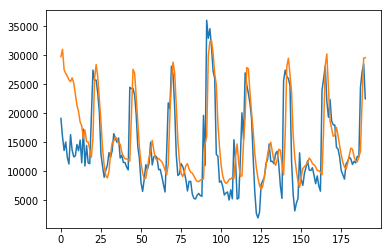

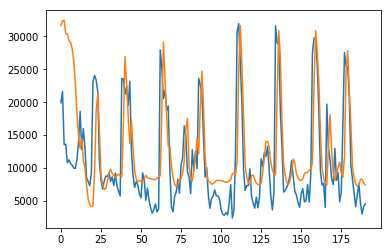

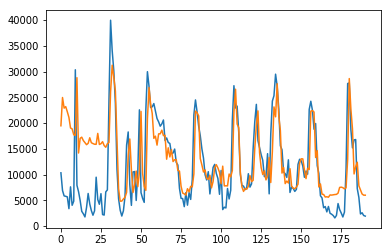

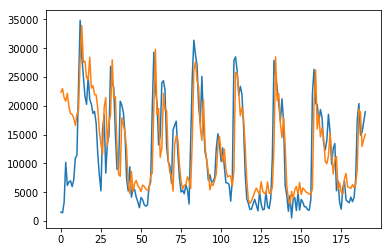

[34, 0.645203699337177, 0.8120206305555091, 0.8470134767053284, 0.7005490536700232]


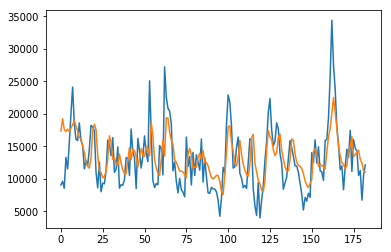

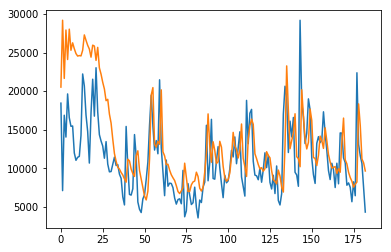

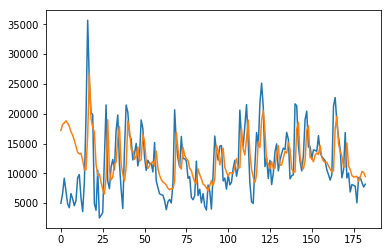

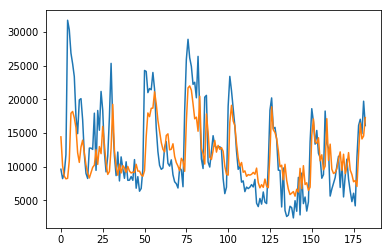

[35, 0.6762536925223015, 1.0551756771971812, 0.985275232892518, 0.9174709729691599]


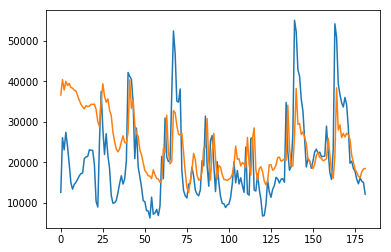

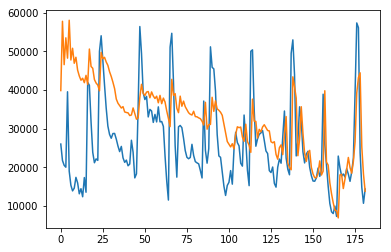

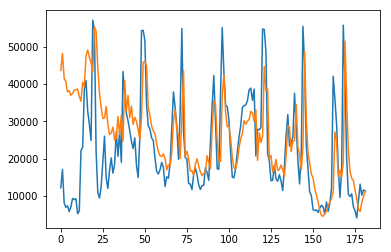

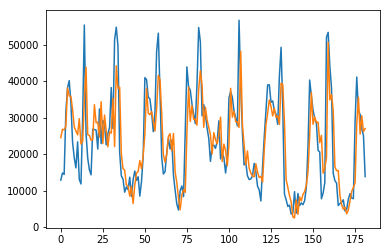

[36, 1.0267477142139039, 1.3310584948741166, 1.1980031593217264, 0.7392219607774455]


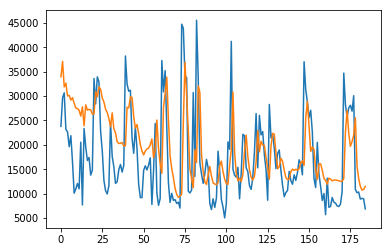

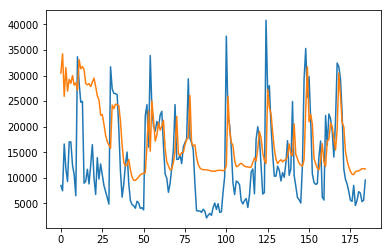

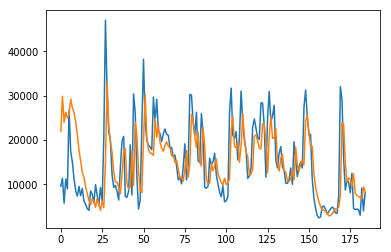

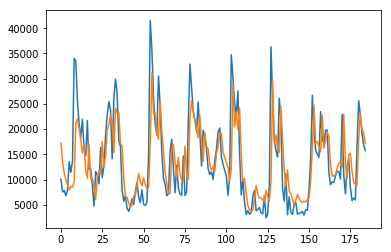

[37, 1.0725054817657844, 1.0372250304229231, 0.8057625961633791, 0.671269075382146]


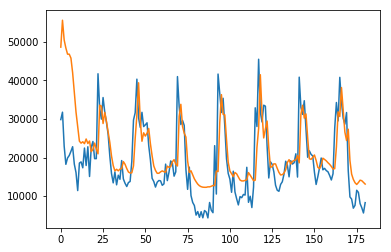

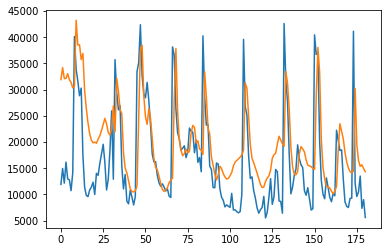

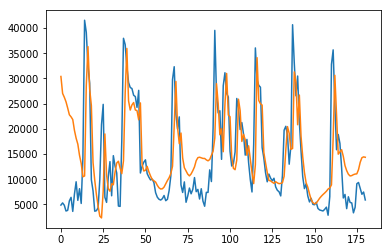

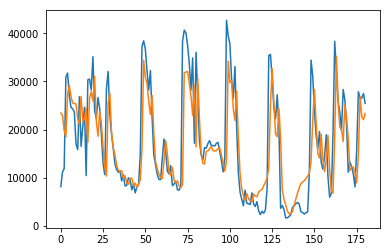

[38, 0.7005304849063884, 0.7869093282972867, 0.7631714630764008, 0.6278544056388411]


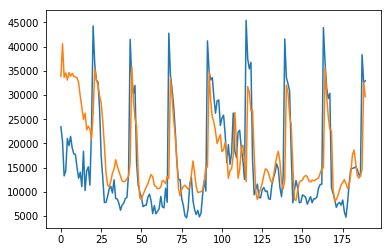

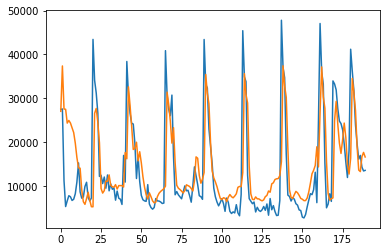

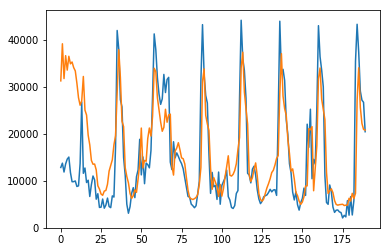

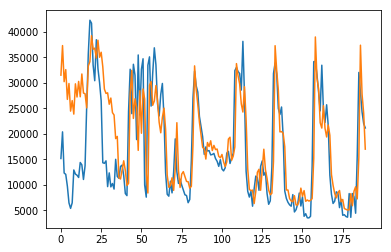

[39, 0.8159414801721653, 0.8097714873245058, 0.7713619726281263, 0.7610037952898282]


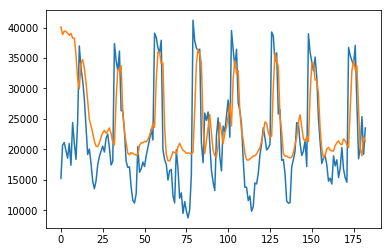

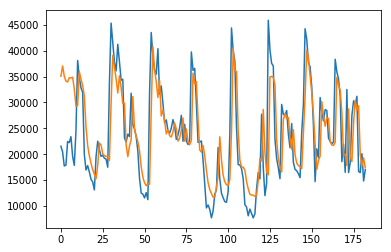

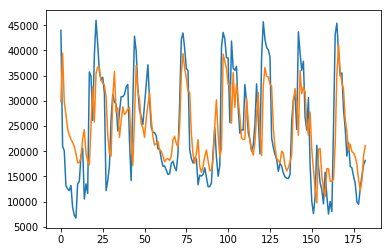

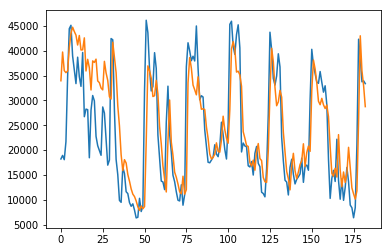

[40, 1.0612202720394421, 0.8824425038609209, 0.8503711690551099, 0.8704558016625398]


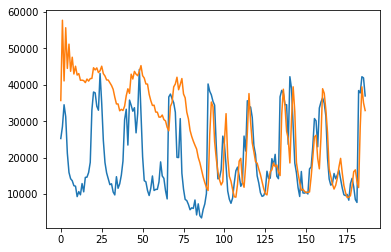

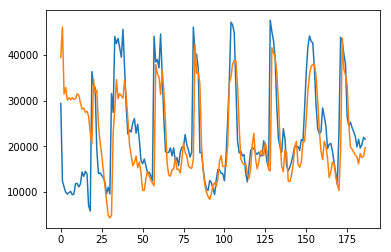

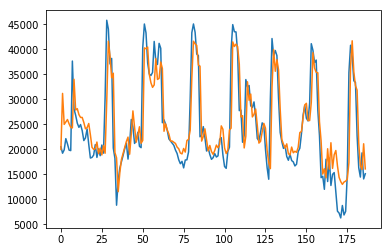

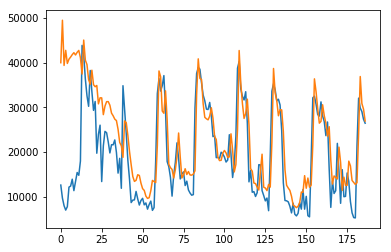

[42, 1.2877504844127907, 0.8264174782084657, 0.45629930954164105, 0.8894901759996963]


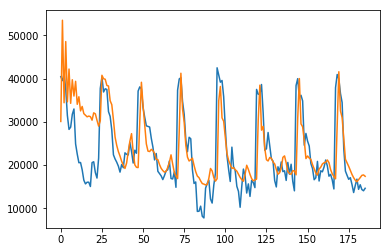

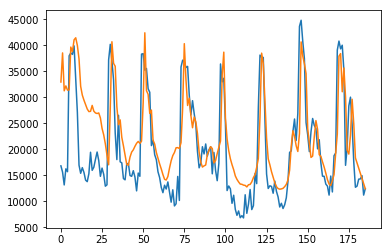

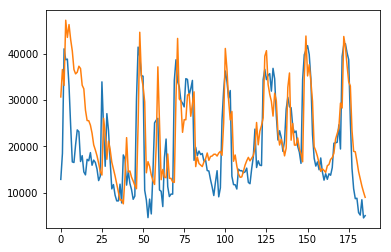

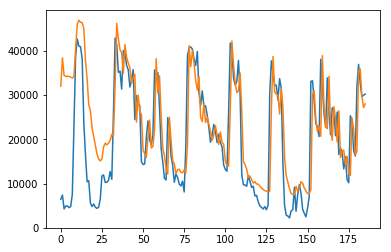

[43, 0.686942312081209, 0.7861963790360041, 0.8186515178338312, 0.9768456299729924]


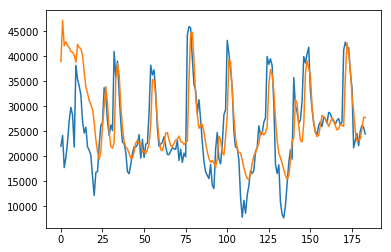

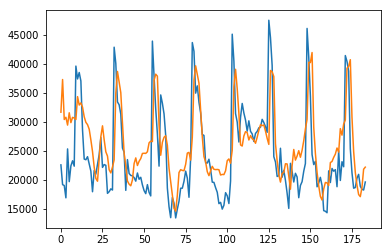

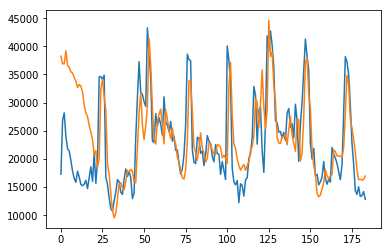

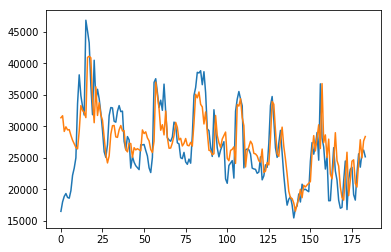

[44, 0.6498428935440534, 0.6439444687162585, 0.7221853426727264, 0.4710536116513388]


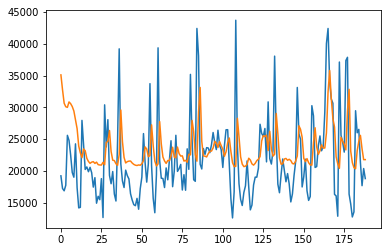

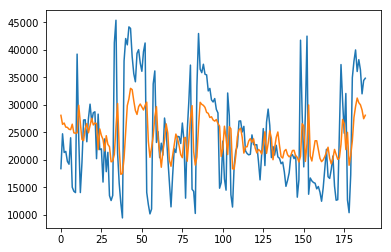

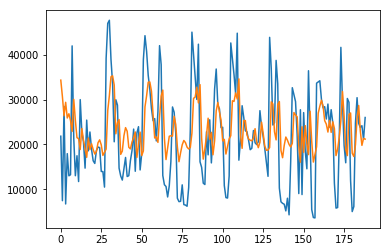

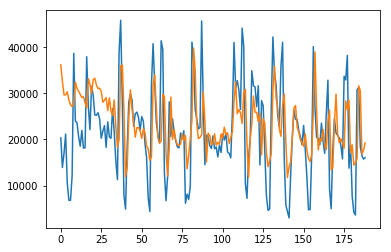

[45, 0.850173179001697, 1.027018102719684, 1.2148611819551534, 1.0193712867575733]


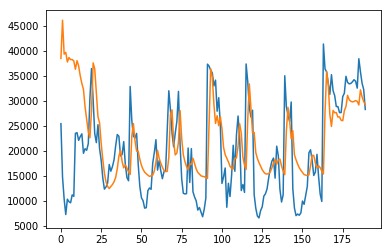

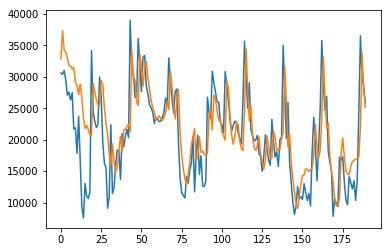

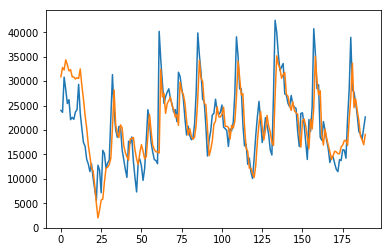

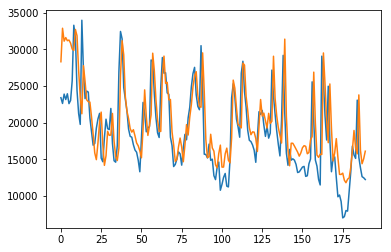

[46, 1.3264777392375382, 0.6556805393271506, 0.6318449125290972, 0.5186865752736534]


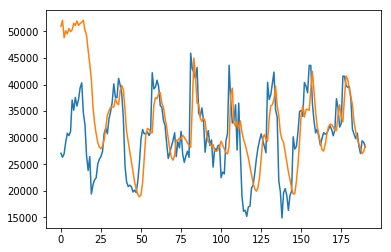

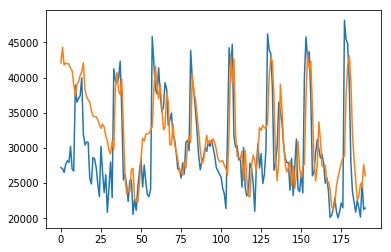

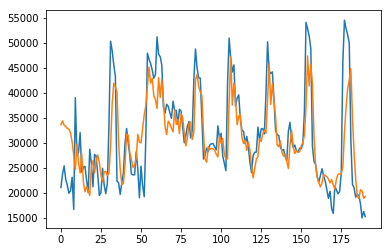

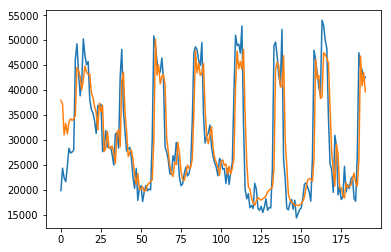

[47, 1.1062026670523808, 0.8199482411341313, 0.8807321202540773, 0.7838341809803367]


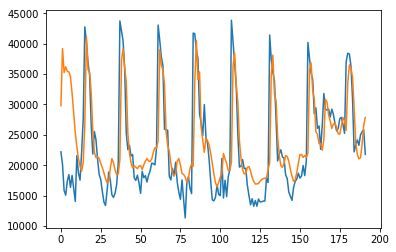

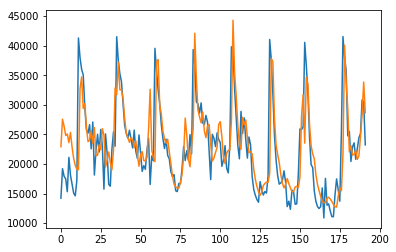

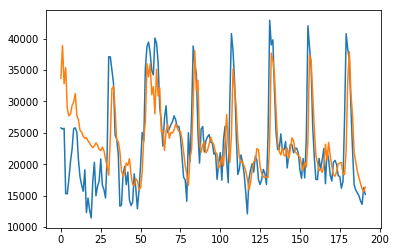

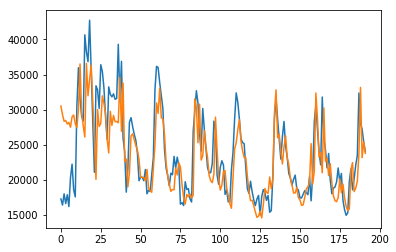

[48, 0.8514540327521813, 0.6405948803300214, 0.7147120360499456, 0.5715653875092216]


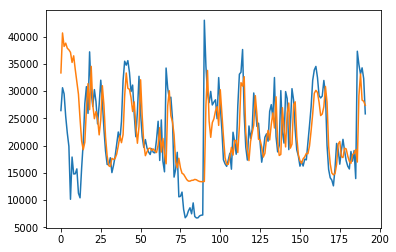

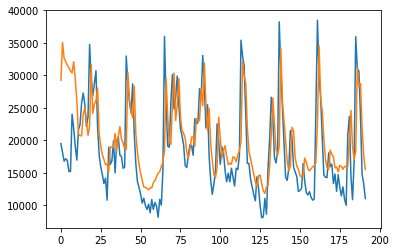

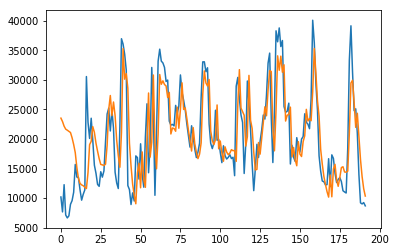

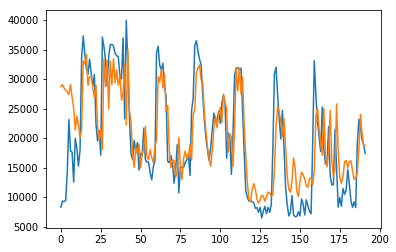

[49, 0.7605231046461733, 0.6897549146365685, 0.7214212872263349, 0.7686698420969685]


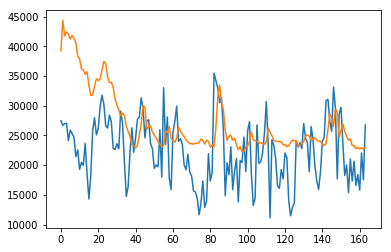

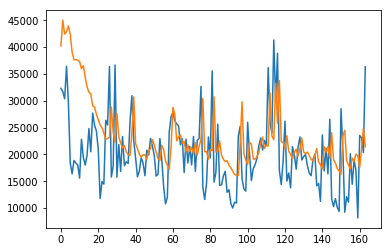

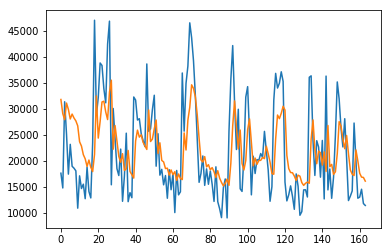

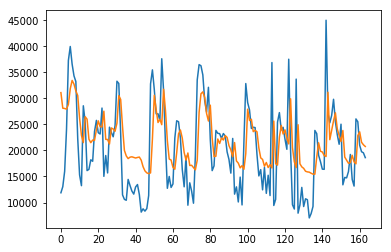

[50, 1.2921927565346165, 1.3317069946957436, 1.1910886049704308, 0.9741623608016857]


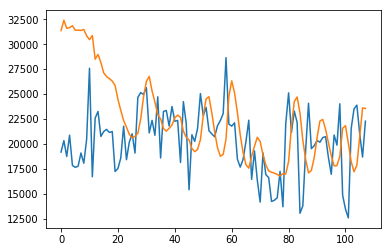

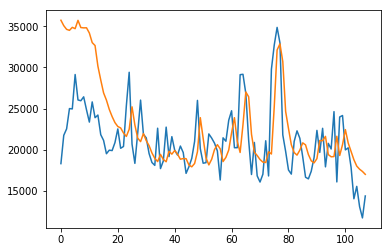

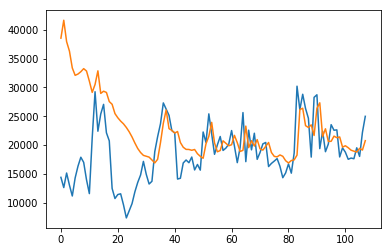

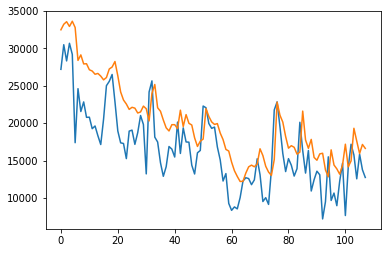

[51, 0.7548007325543811, 0.88333146279942, 1.6033895026539624, 0.9055579246503115]


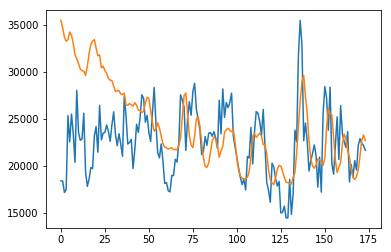

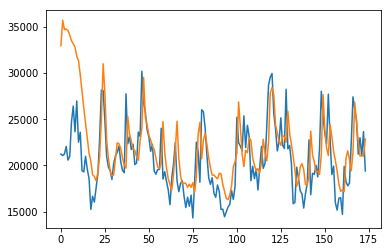

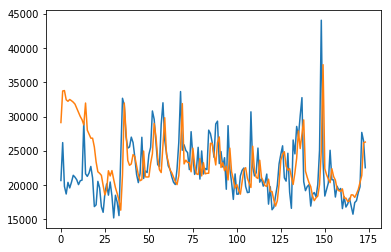

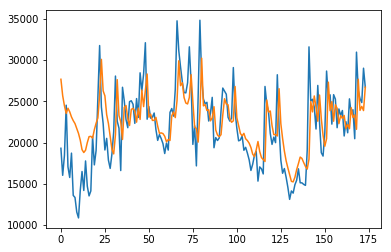

[52, 0.8508899542537783, 0.7322456772143894, 0.9250789049620537, 0.7845149285109159]


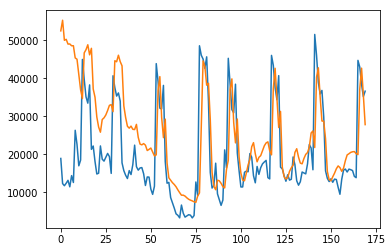

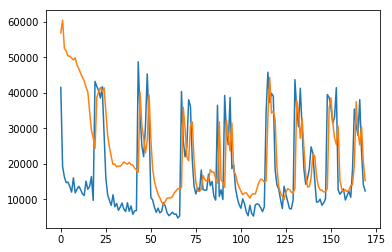

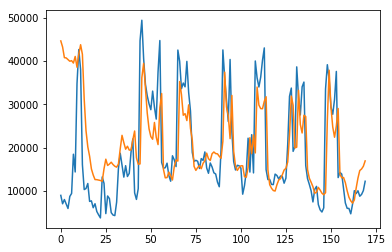

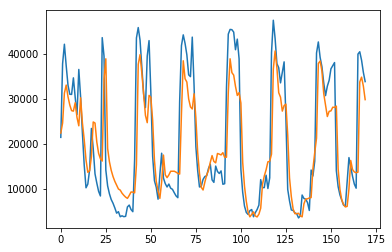

[53, 1.0238858013889884, 1.143472547922106, 0.883697259703626, 0.6334798177868254]


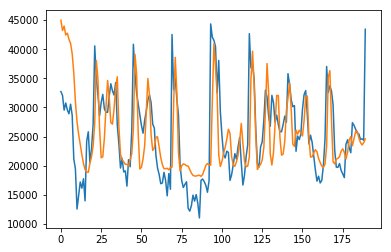

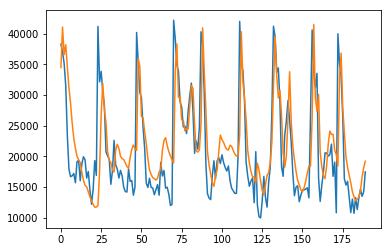

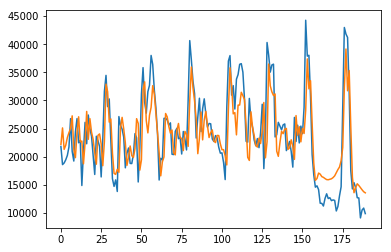

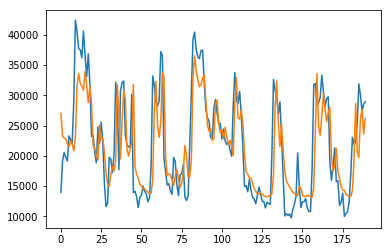

[54, 0.6505936501659064, 0.7116912022690415, 0.5352938884738332, 0.6192115490956699]


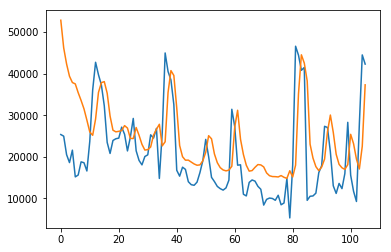

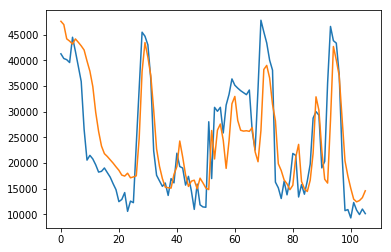

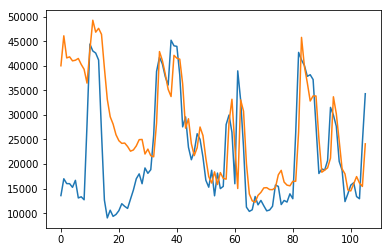

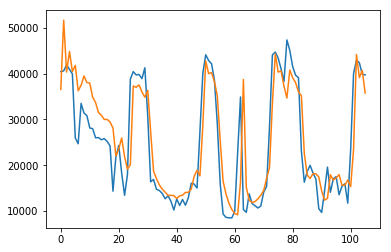

[55, 1.064406560656803, 0.6875375966855546, 1.0369570594901771, 0.6379934518126416]


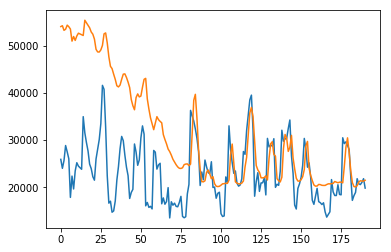

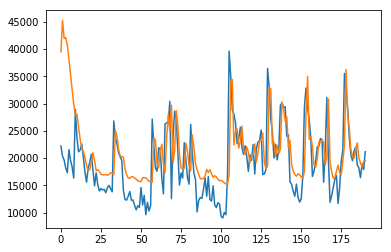

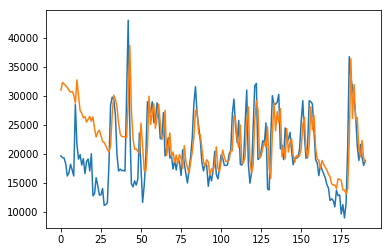

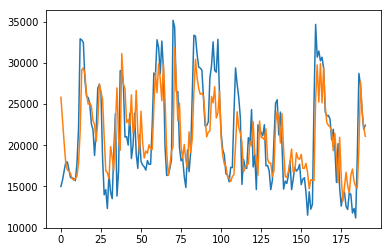

[56, 1.9304465355785312, 0.9618447408930034, 0.8519341050519837, 0.59817034879061]


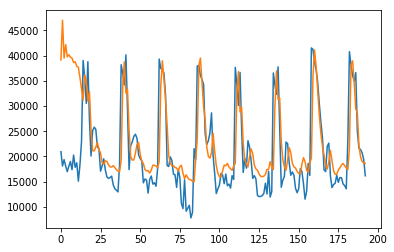

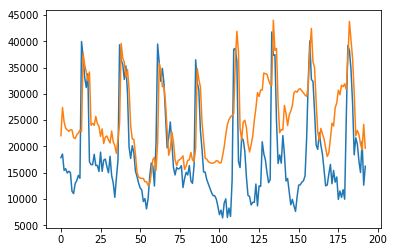

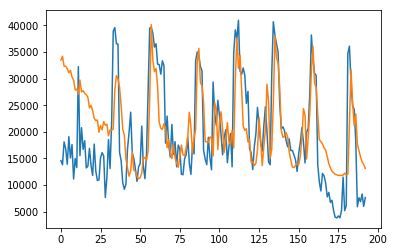

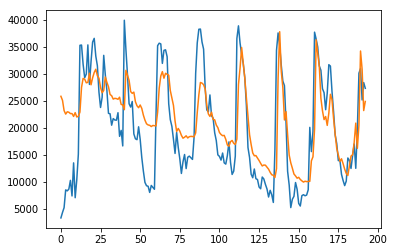

[57, 0.761315012739857, 1.0501562760416743, 0.8512056296630051, 0.7443363356644676]


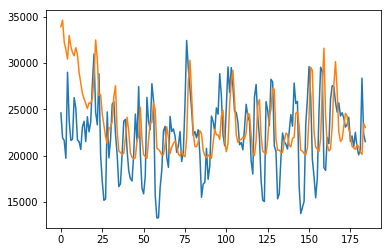

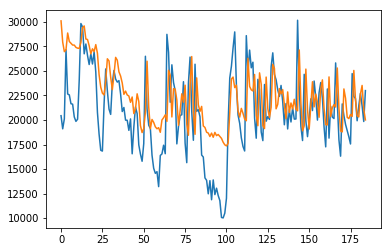

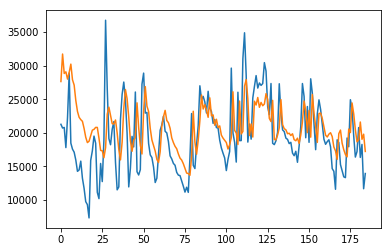

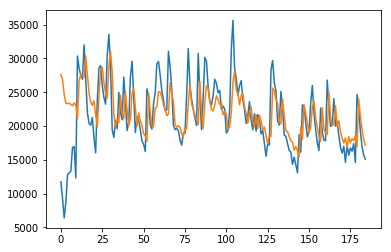

[58, 0.759504772254074, 0.7579405848854643, 1.0163270909050375, 0.8585190493761022]


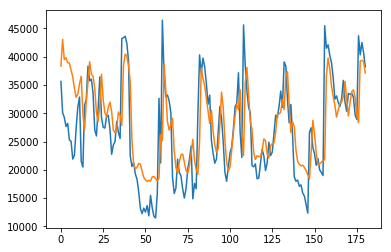

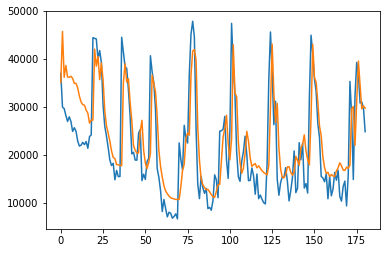

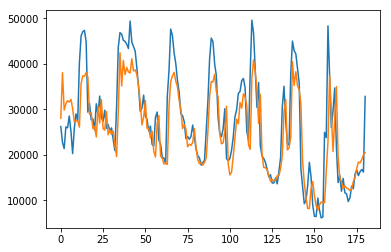

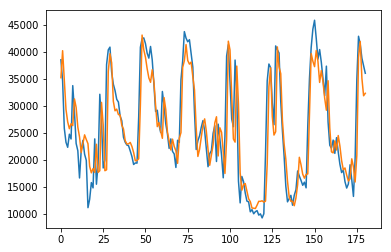

[59, 0.6230111929443044, 0.782914616850607, 0.6123508796622465, 0.4936648941642631]


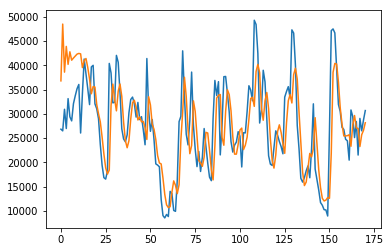

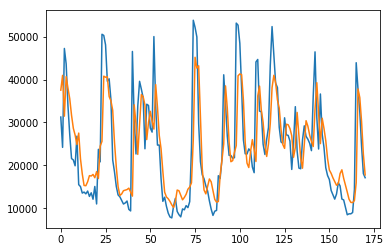

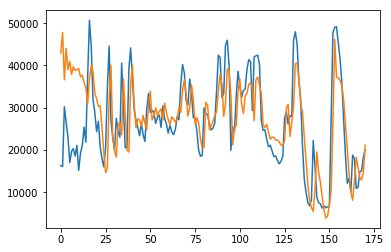

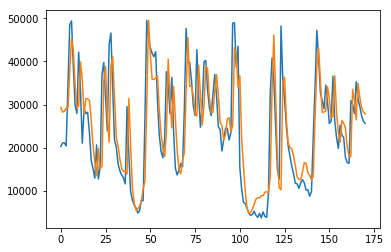

[60, 0.5081809665556747, 0.6655107574329776, 0.6989486747520934, 0.6592789346378988]


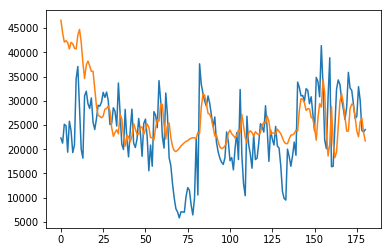

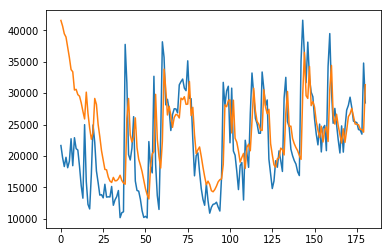

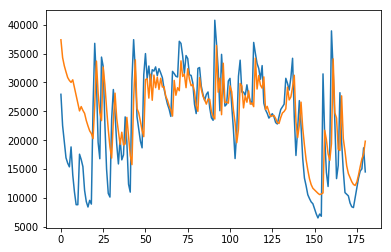

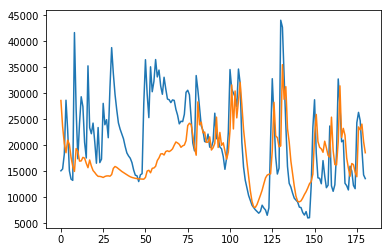

[61, 0.8186306421807825, 0.7736685210969164, 0.7838084662381496, 0.9679101866829403]


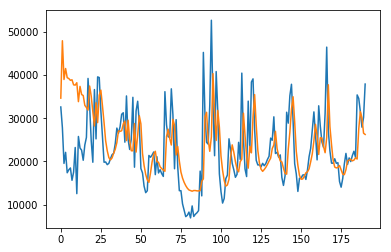

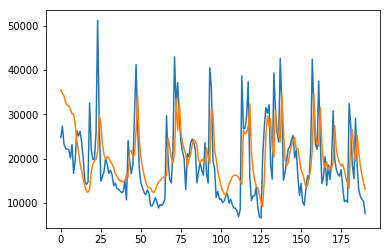

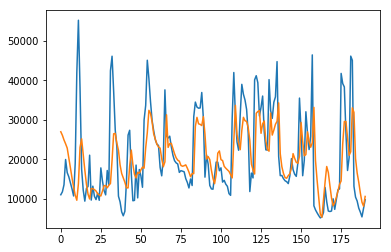

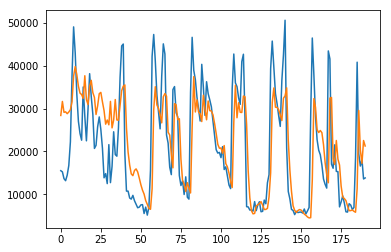

[62, 0.85672418955861, 0.820614274053312, 1.0035295269461646, 0.97984801444413]


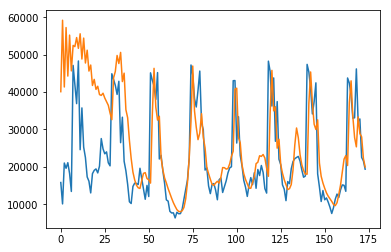

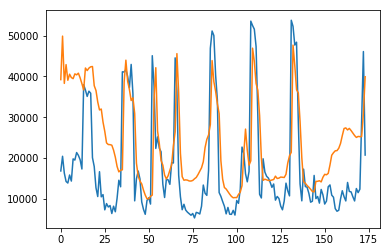

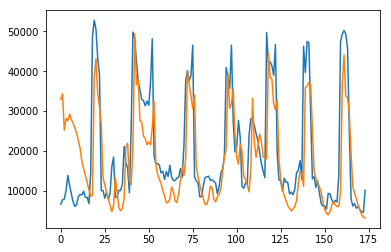

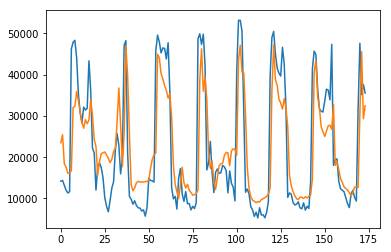

[63, 1.1061784935101568, 1.061182267620482, 0.839988226478969, 0.709186037084768]


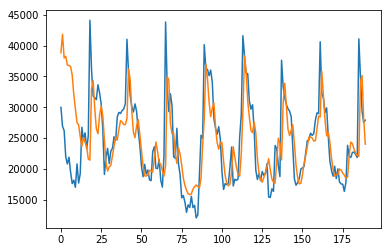

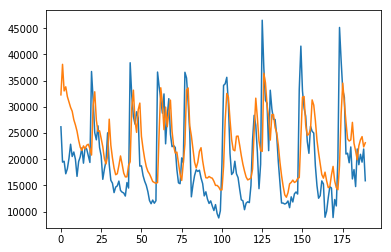

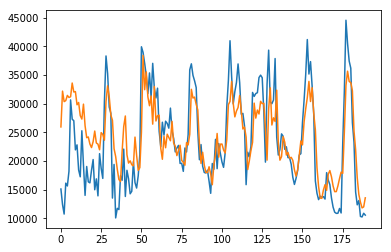

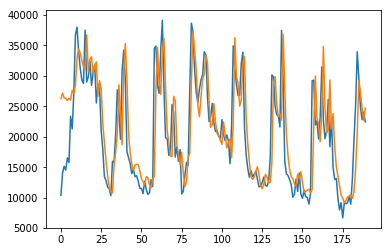

[64, 0.6783676861255852, 0.881802450097799, 0.7302367116599561, 0.6870599781665312]


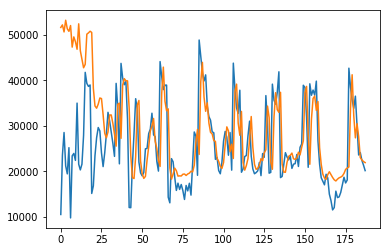

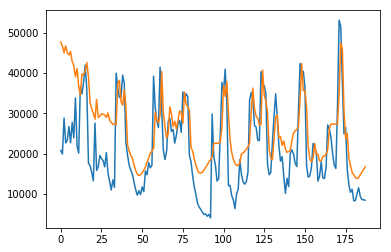

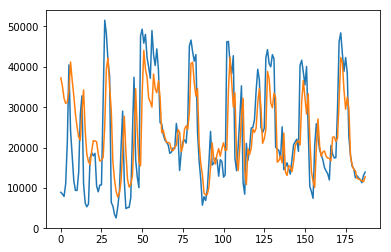

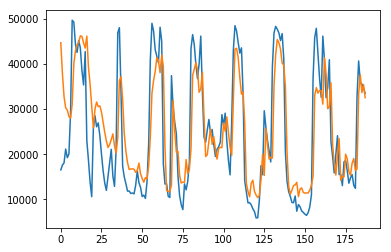

[65, 1.0646558912246993, 0.9604326817203137, 0.945392505669286, 0.7683872850118292]


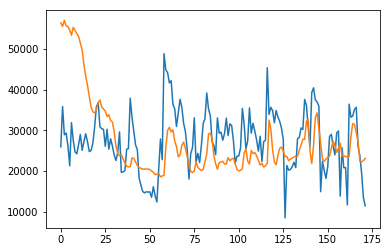

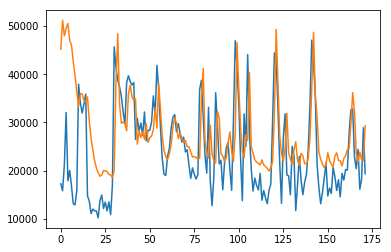

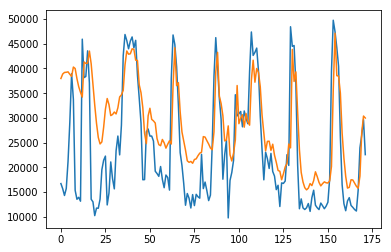

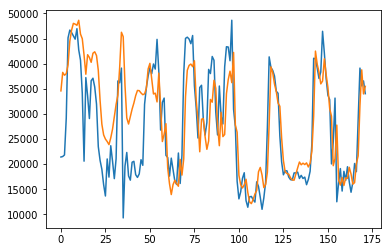

[66, 1.16228753612615, 1.15731782253375, 1.083625819991765, 0.7990171132552308]


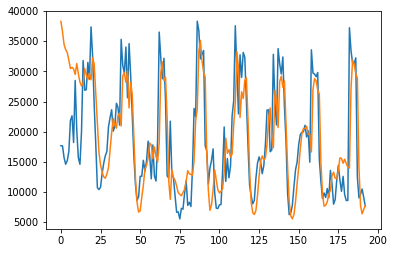

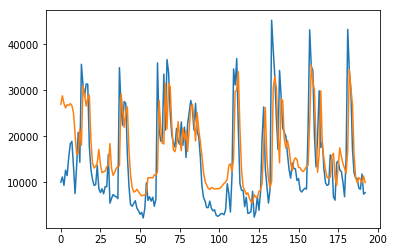

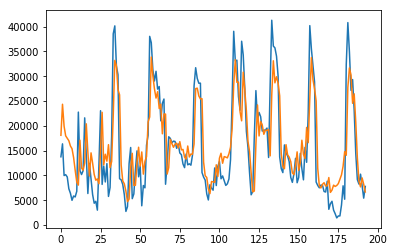

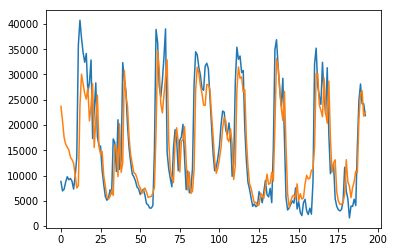

[67, 0.5815625083531247, 0.7569317151450027, 0.5944132352952507, 0.6073024058012771]


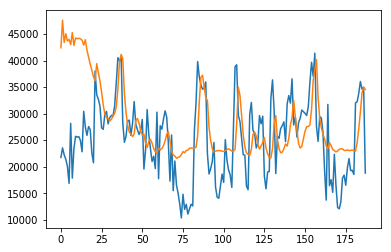

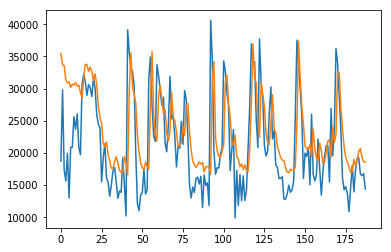

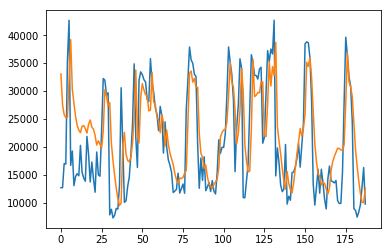

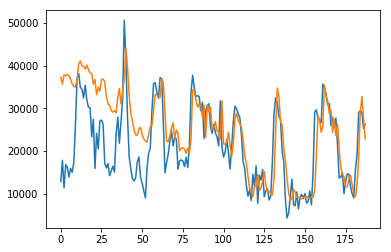

[68, 1.0144274379107596, 0.7620919531341305, 0.8551297067850876, 0.9314334089034467]


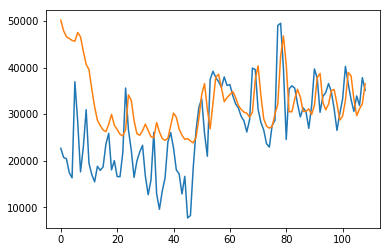

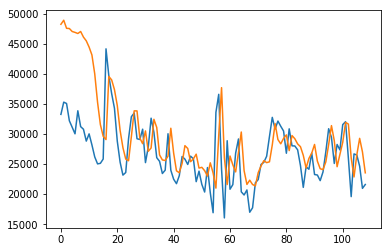

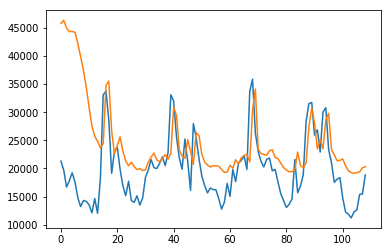

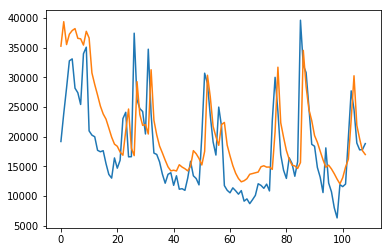

[69, 1.2463562590314816, 0.7244838174850528, 1.1392840672366482, 0.7390294785530348]


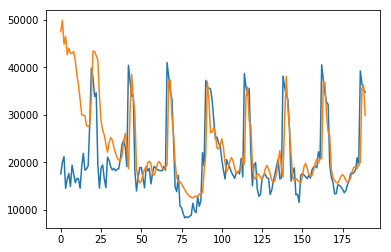

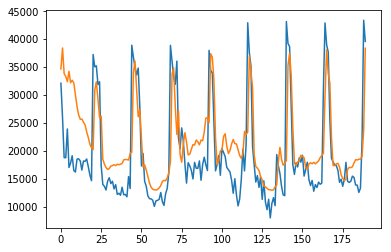

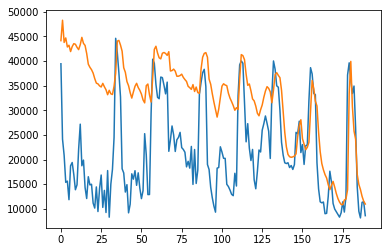

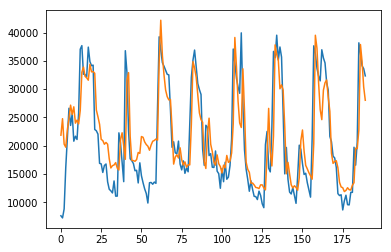

[70, 0.9504350392860116, 0.7558392302956272, 1.68614420223909, 0.6173584364490742]


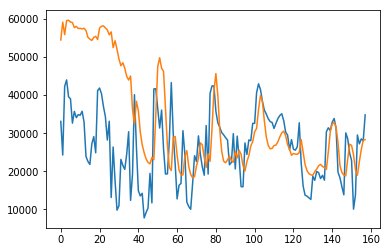

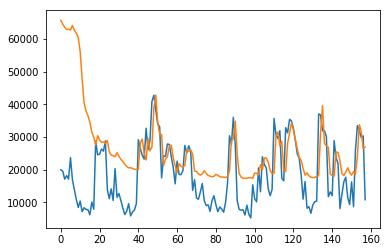

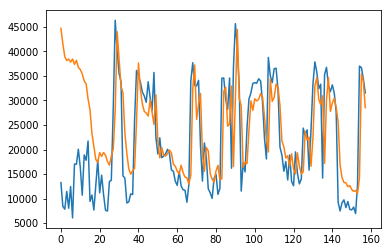

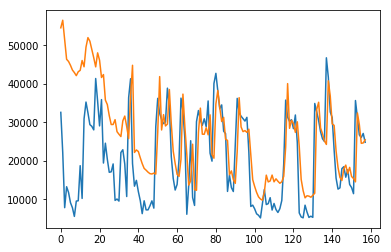

[71, 1.4954049369522195, 1.6620114701735125, 1.006202625950653, 1.2597372316539557]


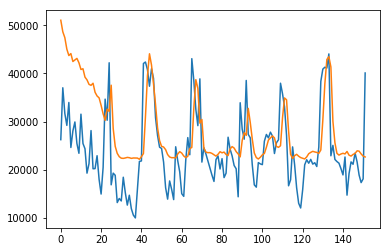

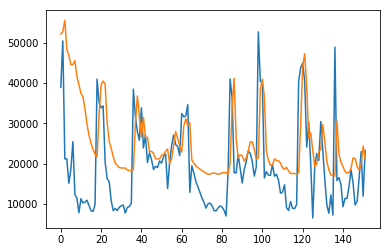

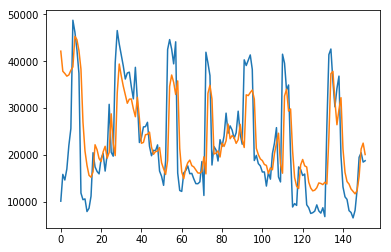

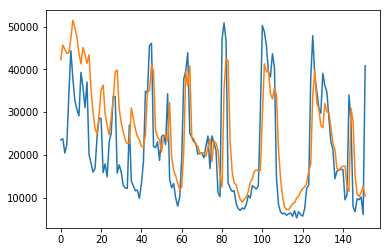

[72, 0.9557115044777227, 1.3469572754362806, 0.8488727581254497, 1.0118539940484308]


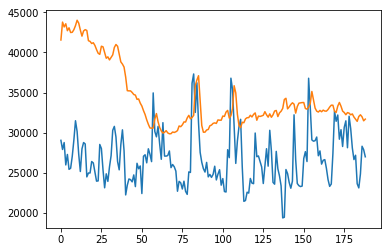

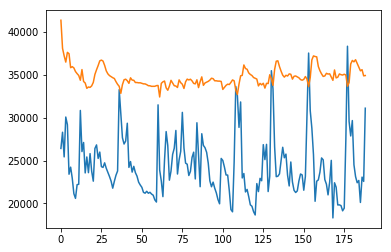

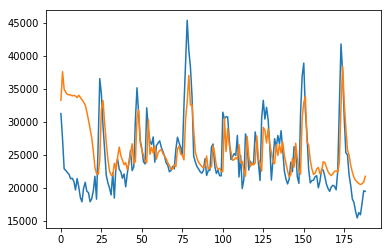

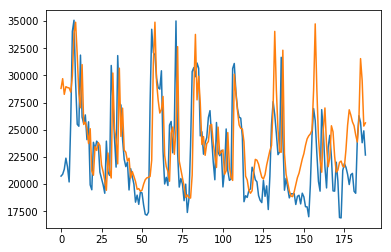

[73, 1.7916931800133609, 2.256118608836327, 1.0231236467779963, 0.7477811680344875]


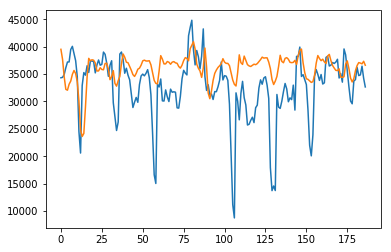

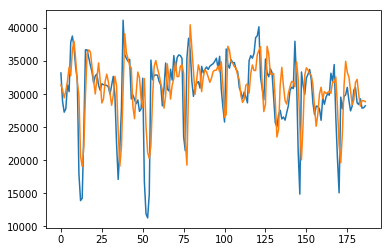

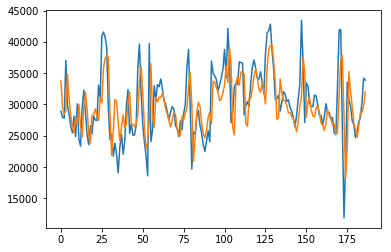

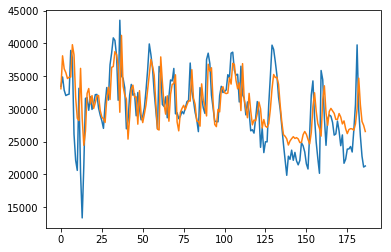

[75, 0.8824206355643858, 0.6187603235595079, 0.6354542554547771, 0.6016434418628538]


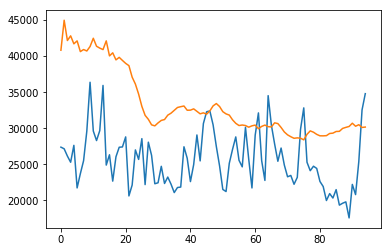

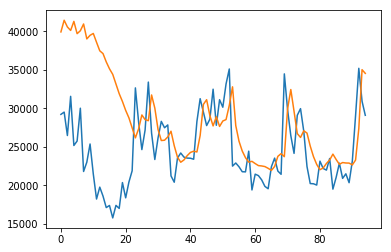

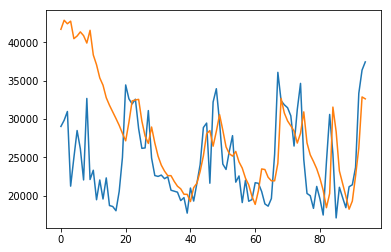

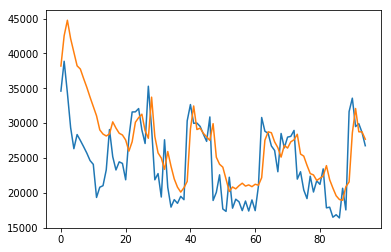

[76, 1.5920552095179763, 1.3527643652440393, 1.2495130852779344, 0.8818770036551333]


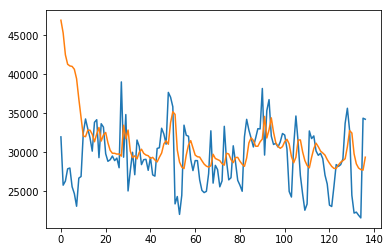

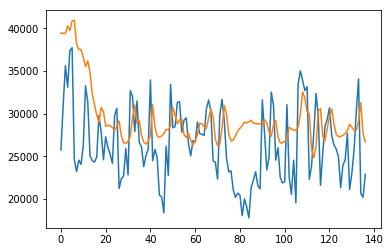

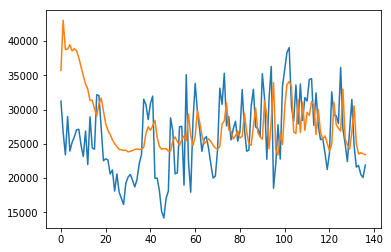

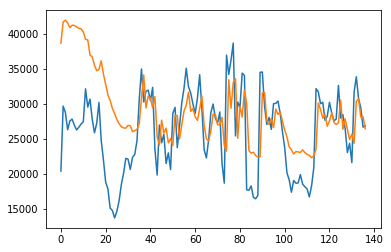

[77, 0.8415240959958935, 0.9542957514389443, 1.0031278010641147, 1.1165808175171301]


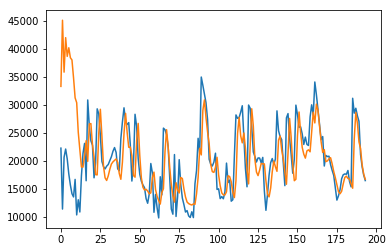

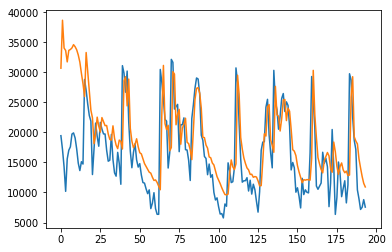

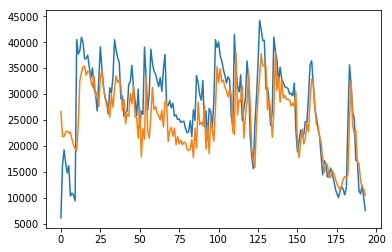

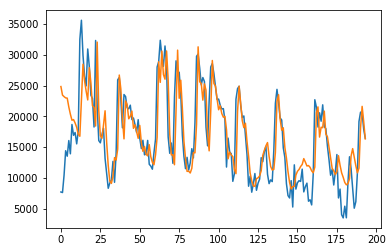

[78, 0.6782681913666282, 0.8222214598576897, 0.7346533162683401, 0.5377262704801593]


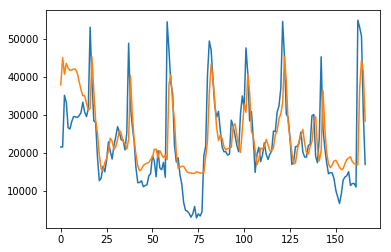

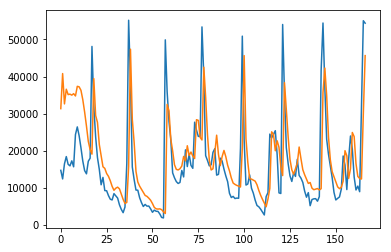

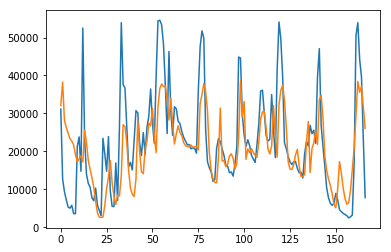

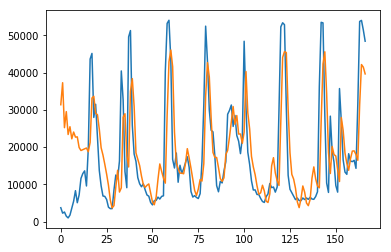

[79, 0.7289041748162095, 0.9349605571407681, 0.833732365963467, 0.9236426357607522]


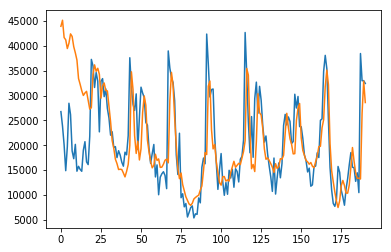

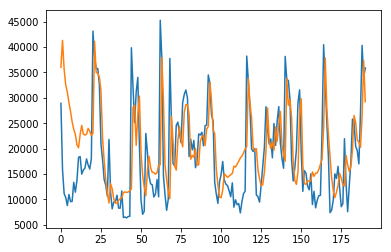

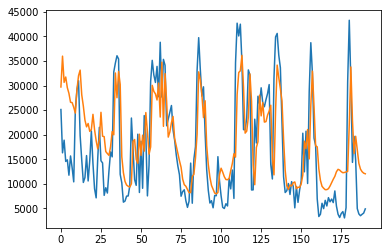

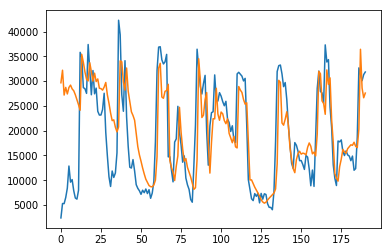

[80, 0.7280325039491715, 0.8269102435092107, 0.8418641710561461, 0.823475045299277]


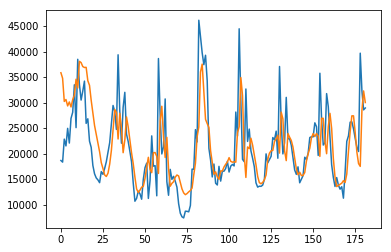

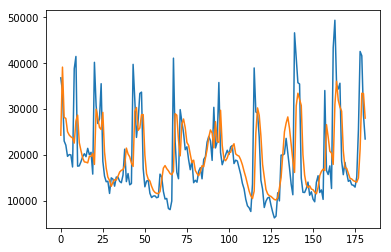

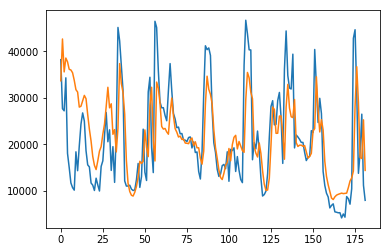

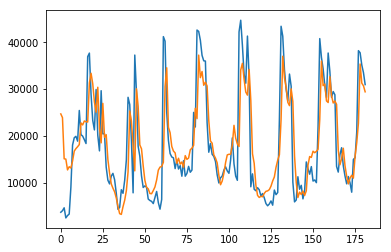

[81, 0.5797234646268836, 0.7789354509298356, 0.9029048666176386, 0.7382413389340555]


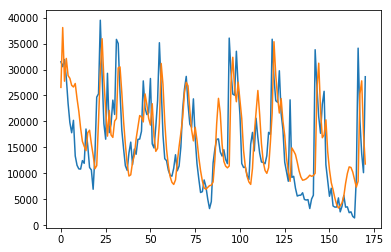

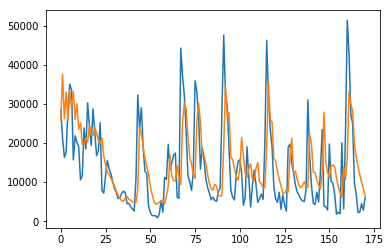

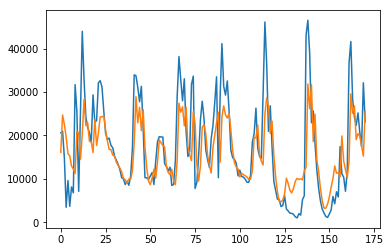

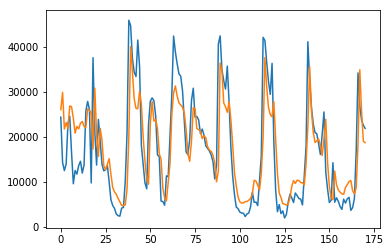

[82, 0.6451000921213643, 0.9162328100604442, 0.7516759933563286, 0.6747569990868402]


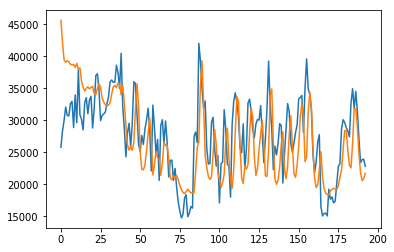

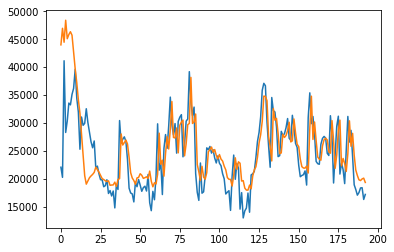

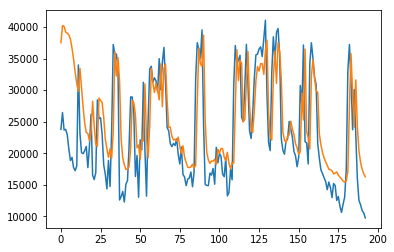

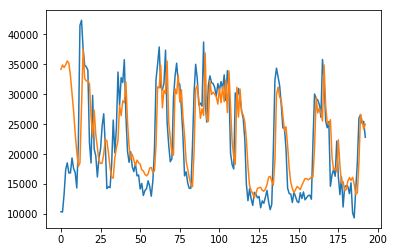

[83, 0.503532735914233, 0.5970476669396212, 0.8395615965293439, 0.7575245116282333]


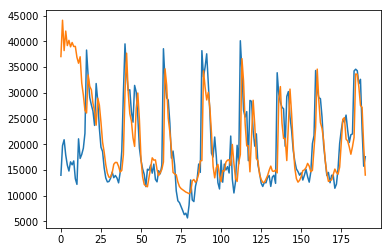

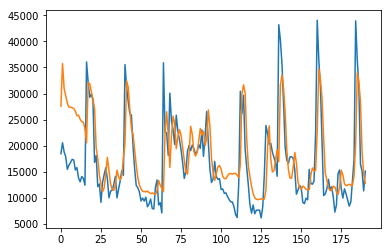

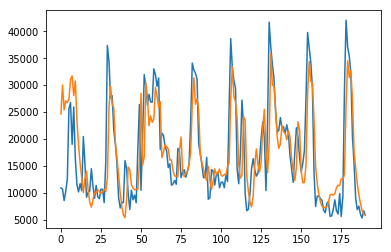

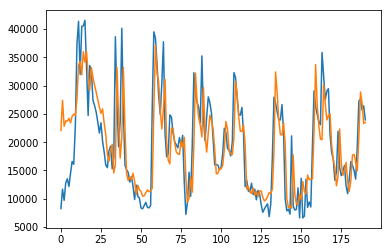

[84, 0.8334482873607046, 0.7358022311655094, 0.7485090824937609, 0.6590519164888561]


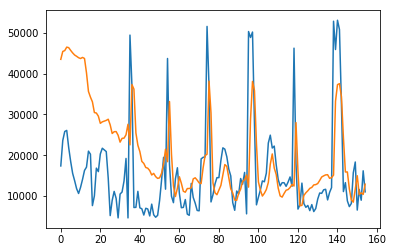

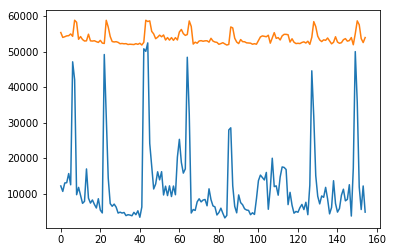

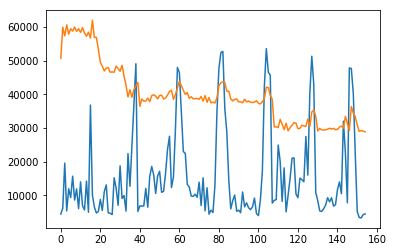

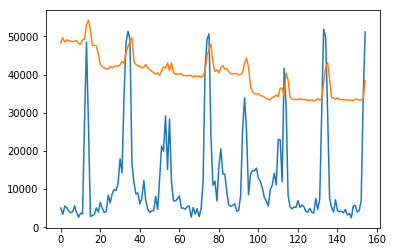

[85, 1.2348598105827764, 3.846524688351483, 2.606771926897443, 2.606641378874956]


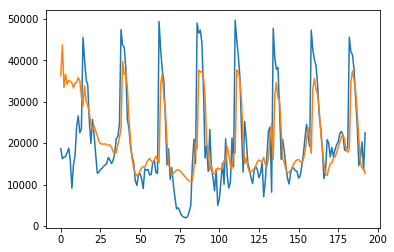

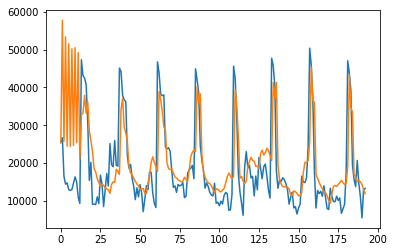

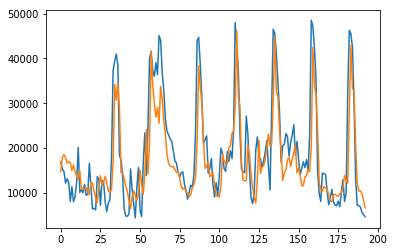

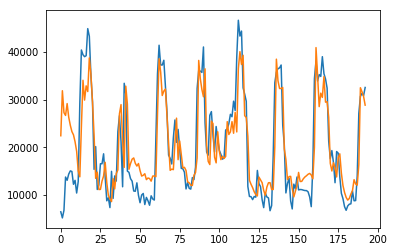

[86, 0.7249114355827775, 0.8373597410737929, 0.5638313359497914, 0.5402022313749915]


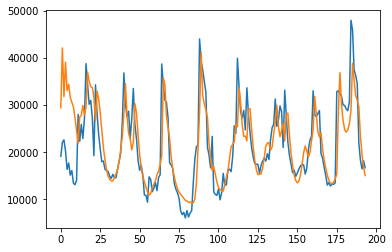

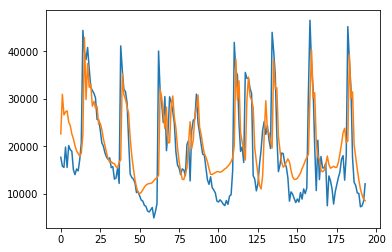

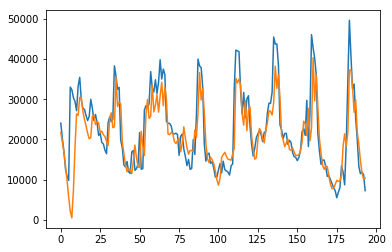

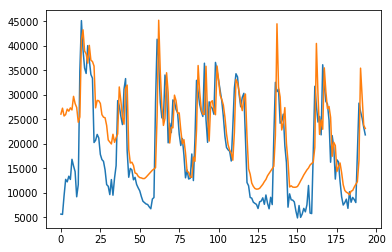

[87, 0.611719287254724, 0.736416472664771, 0.6613554239156839, 0.7347419063903702]


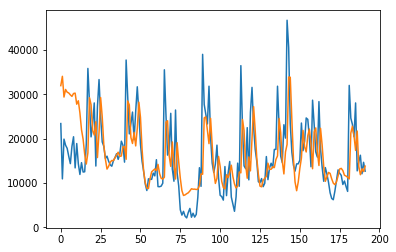

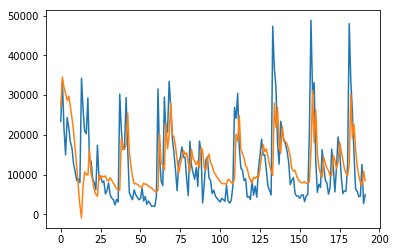

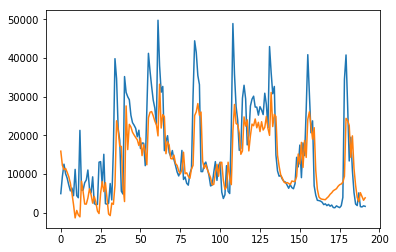

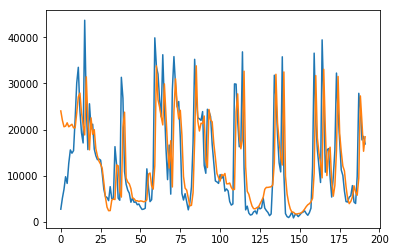

[88, 0.7546526483736491, 0.9026998121613065, 0.86134625147204, 0.805022918874009]


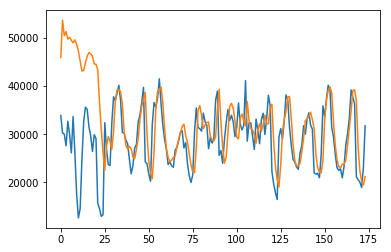

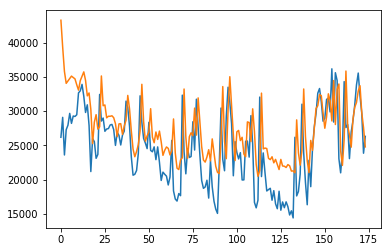

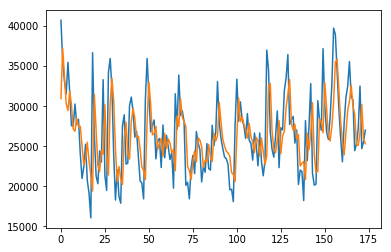

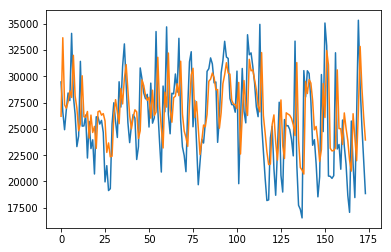

[89, 0.8506165683150005, 0.5902702576106981, 0.5357854253460919, 0.5315753075539751]


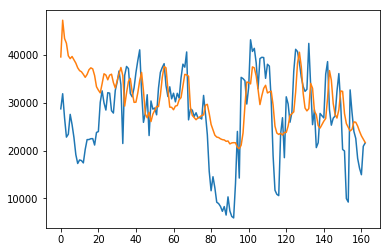

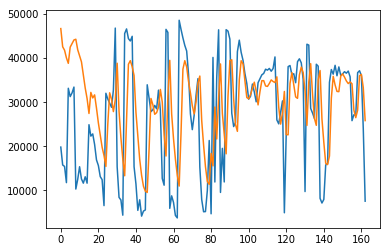

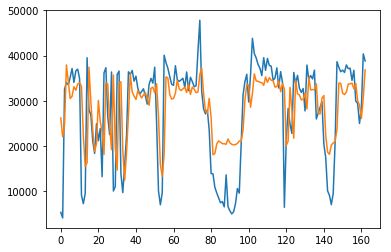

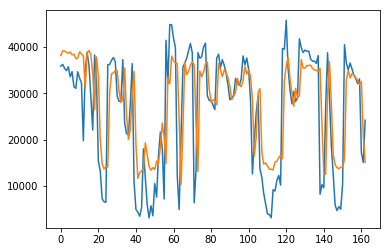

[90, 1.120908484041174, 1.6002487834971941, 0.8346829615262876, 0.864273352053348]


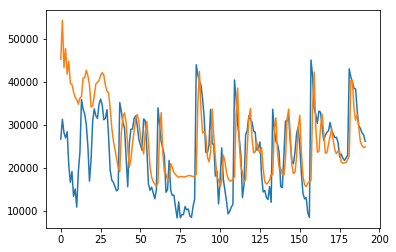

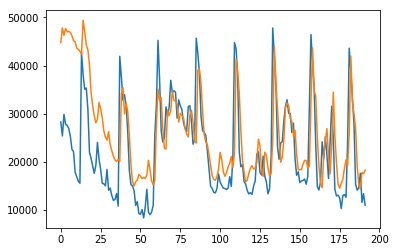

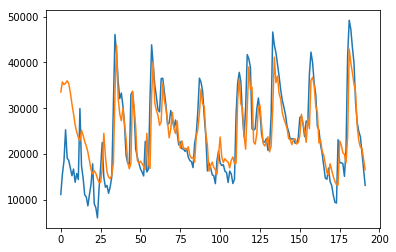

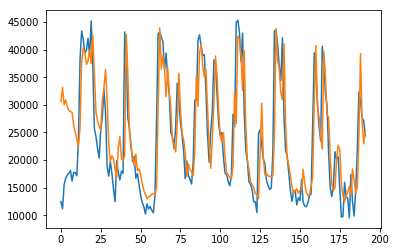

[91, 0.8959129103845777, 0.9628372246765946, 0.6572466647925473, 0.6624323892392666]


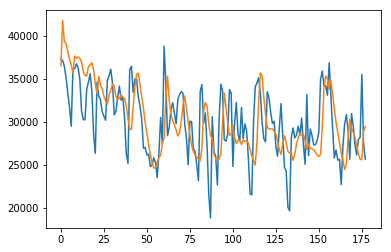

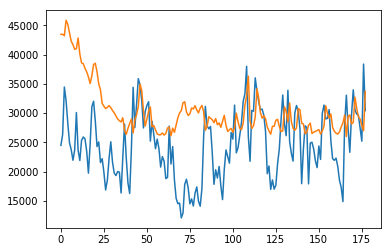

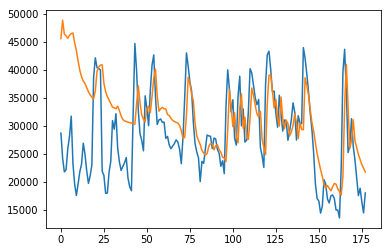

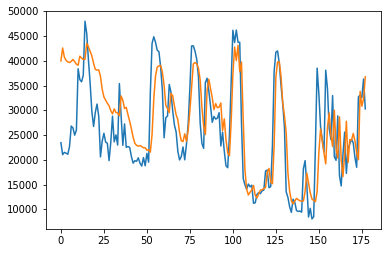

[92, 0.5480963378298032, 1.540616520977741, 1.3284323648809557, 1.1090826366333852]


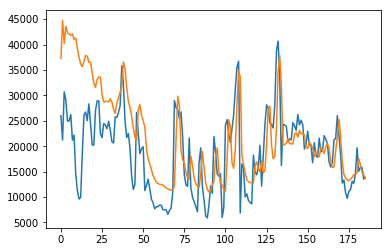

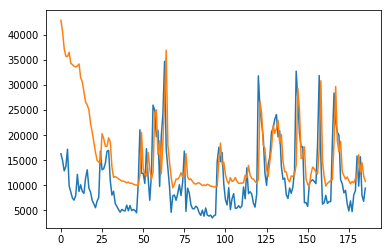

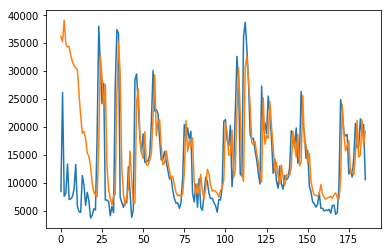

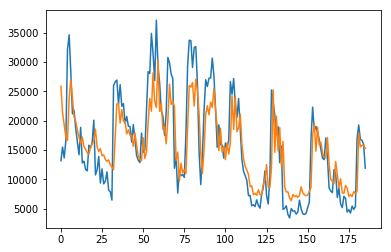

[93, 1.0060072417138877, 1.1629397569158235, 1.0205889140382056, 0.5678223573351625]


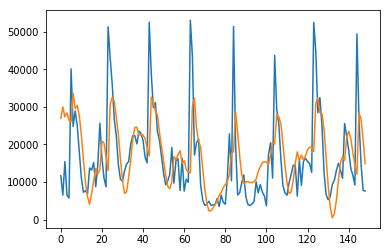

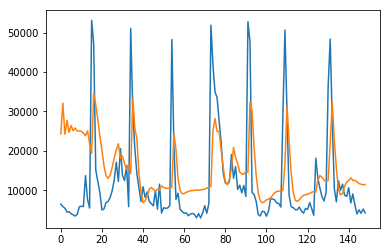

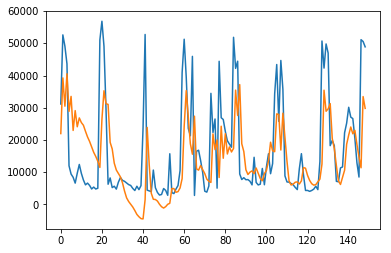

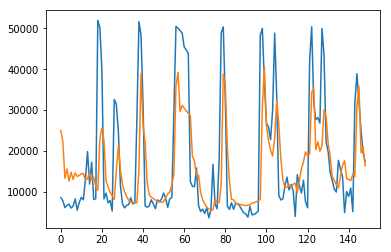

[94, 0.9591473187371294, 1.0330766108101814, 1.1383825007979502, 0.8427683114096562]


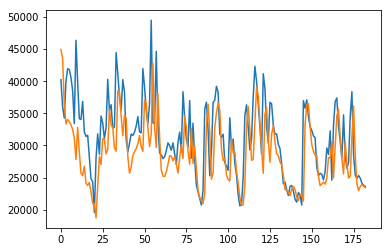

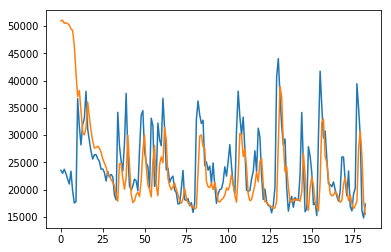

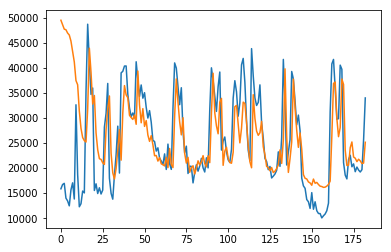

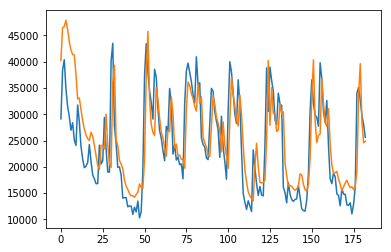

[95, 0.4296600871679756, 0.7934029155287974, 0.9848164582182921, 0.646118932633065]


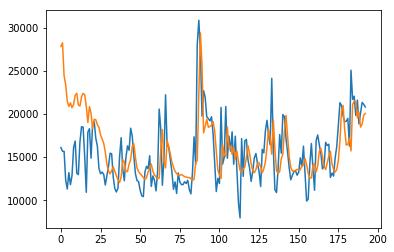

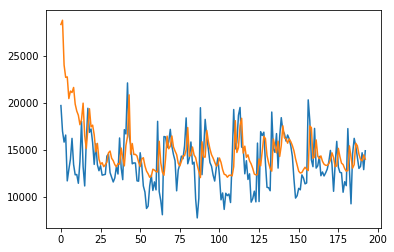

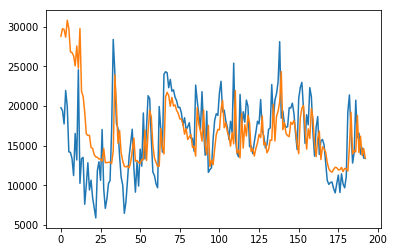

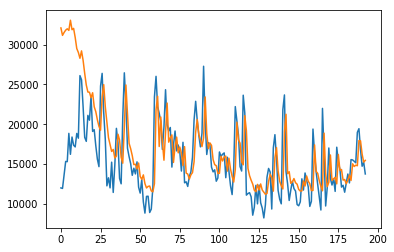

[96, 0.6616774340934277, 0.670387729407399, 1.110915198703738, 1.1507833745522231]


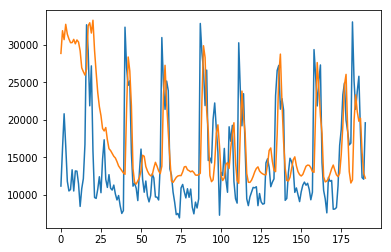

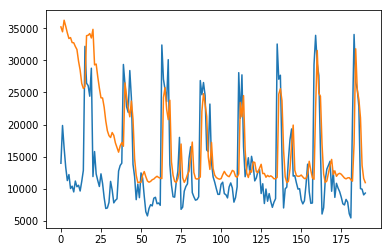

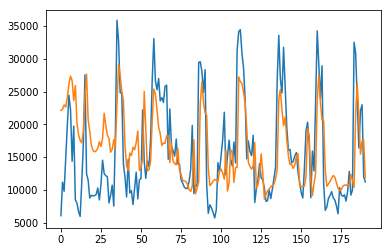

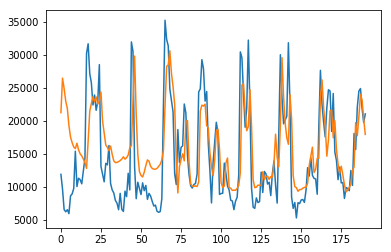

[97, 1.0566506668610363, 1.2346723413448242, 0.911484208865368, 0.8502011973565023]


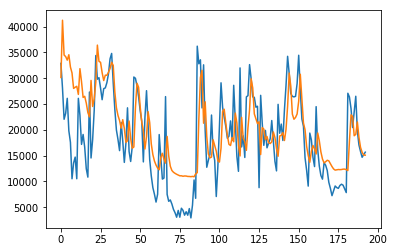

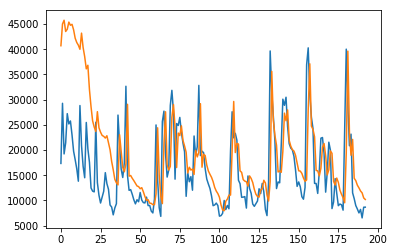

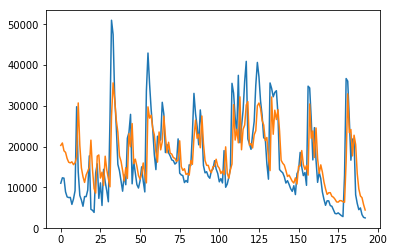

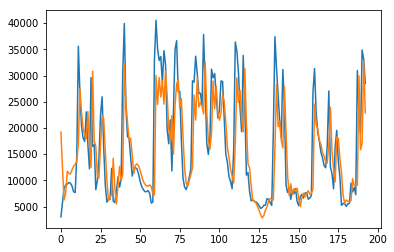

[98, 0.7499879979670288, 1.0333146134407403, 0.8095821401100367, 0.7326238237788851]


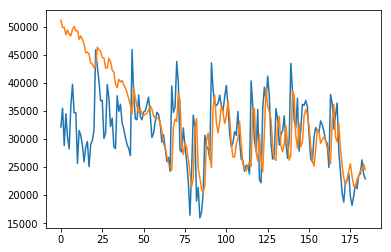

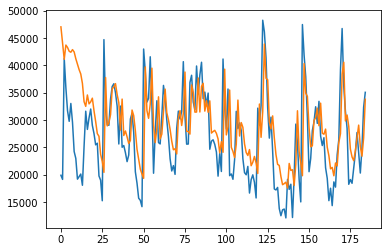

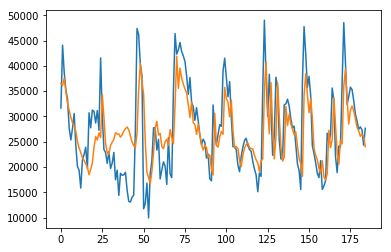

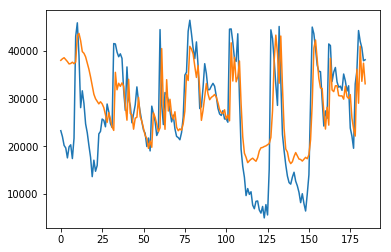

[99, 0.8441179264321629, 0.9832237573389694, 0.7944161843362207, 1.012464308613038]


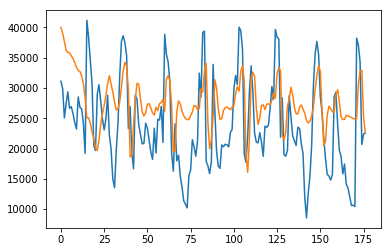

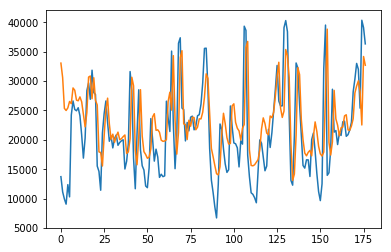

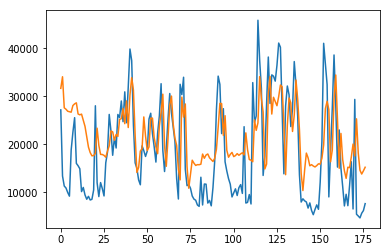

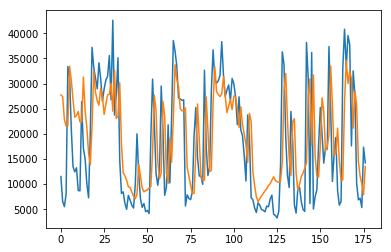

[100, 0.8795174812889509, 0.8072207180799138, 1.0408521959654389, 1.0285831722965453]


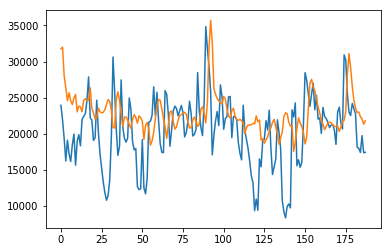

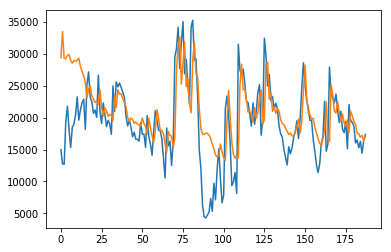

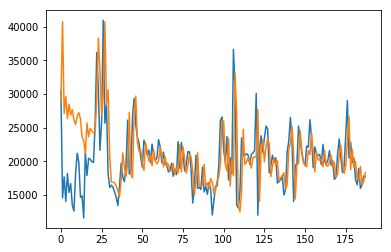

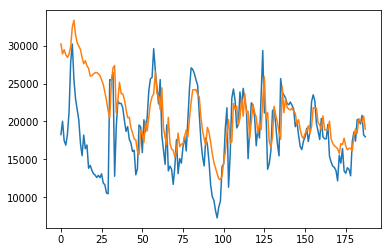

[101, 0.8516212750077853, 0.8066356988878131, 0.7758288949648011, 0.8395748306790147]


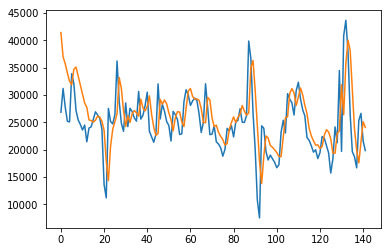

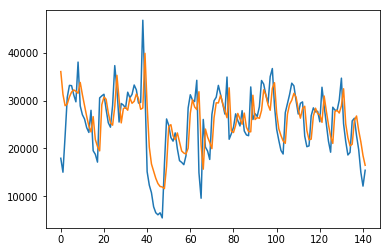

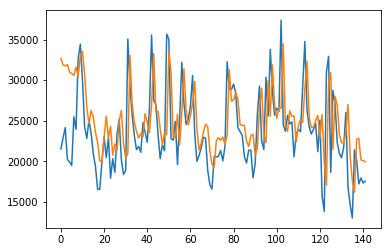

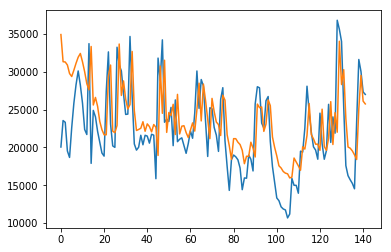

[102, 0.47601020324839133, 0.6131934561418433, 0.6062835877543781, 0.644533308460981]


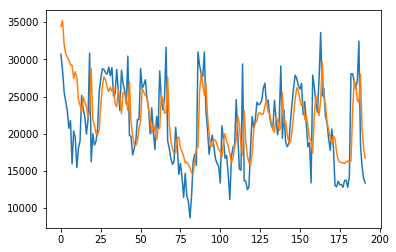

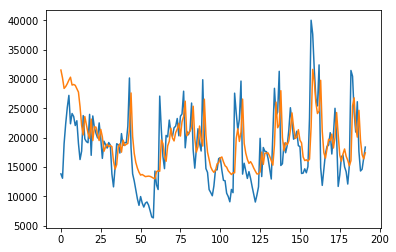

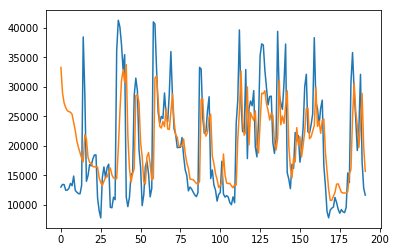

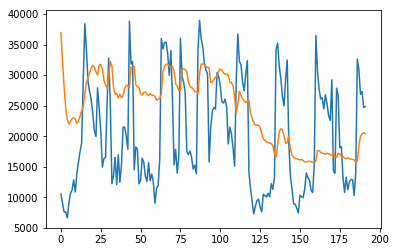

[103, 0.5200639651830421, 0.7307884133581524, 1.031009228299745, 1.2995150055899296]


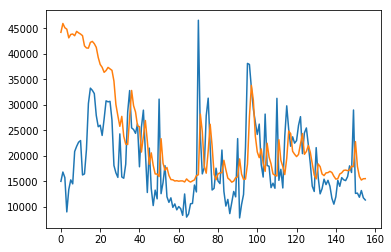

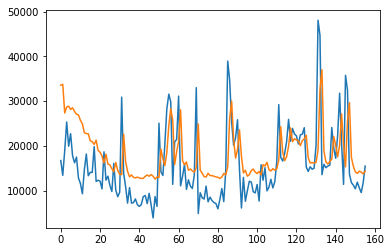

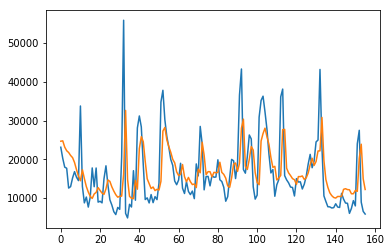

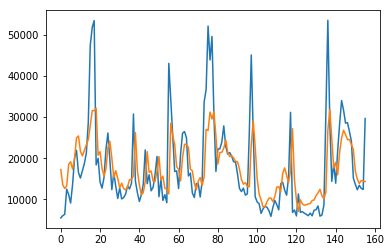

[104, 1.0664830418444684, 0.9002192675920405, 0.852416631601854, 0.8882558859897381]


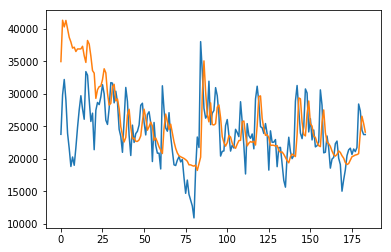

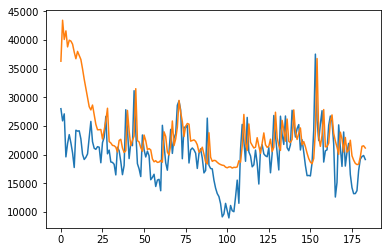

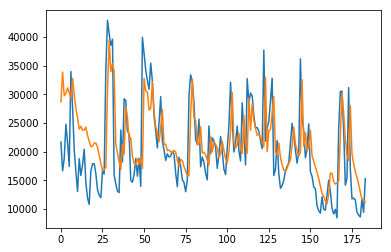

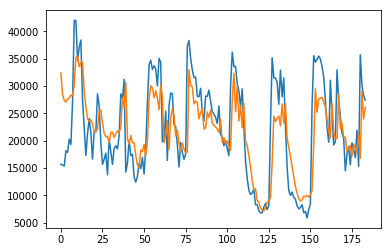

[105, 0.8246580890764859, 1.090834562842967, 1.0438088430599233, 0.9202343291929345]


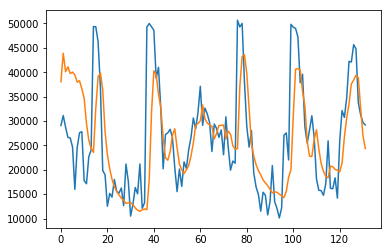

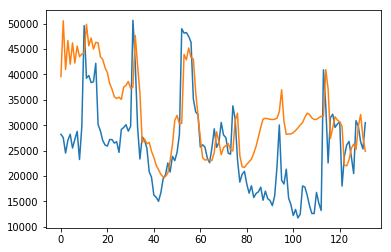

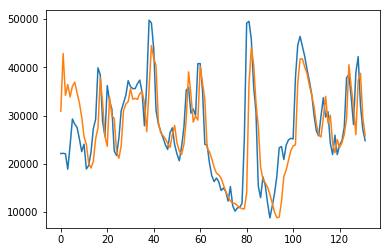

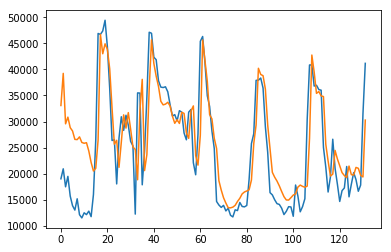

[106, 0.9311140015640093, 0.9761537277061297, 0.6636967922372203, 0.7134037006853439]


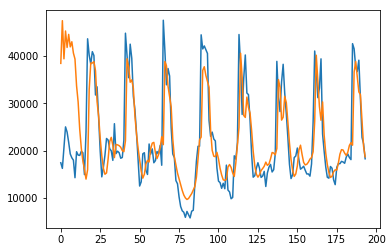

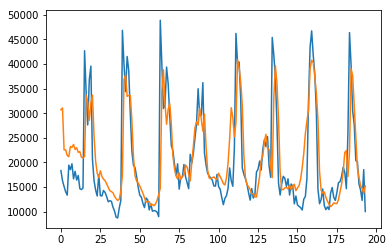

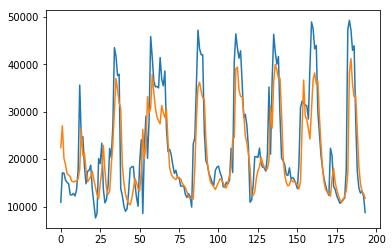

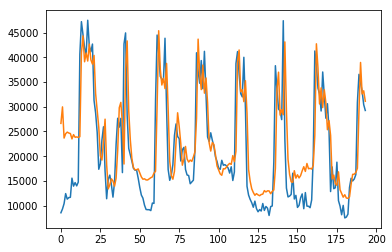

[107, 0.7246465497610817, 0.6527296063448058, 0.6332783193738448, 0.6748365104273608]


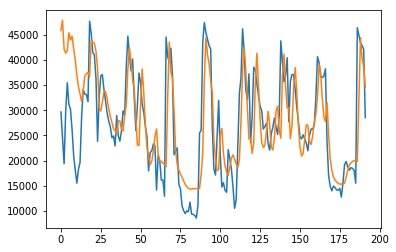

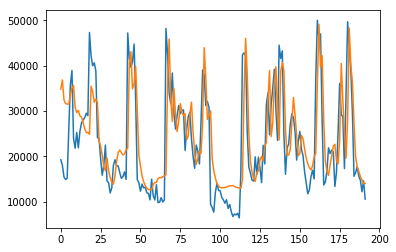

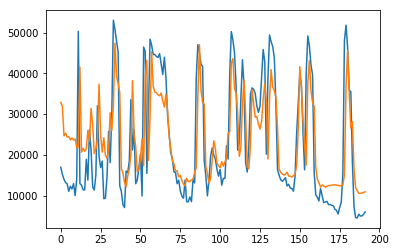

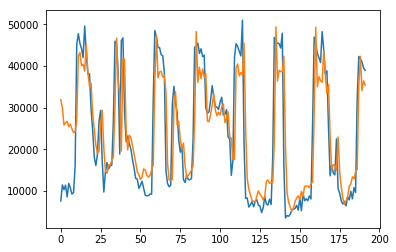

[108, 0.7065858480502745, 0.7544340638470789, 0.8725868274163319, 0.6985666631528057]


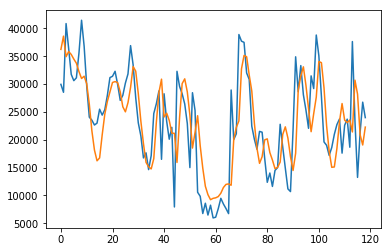

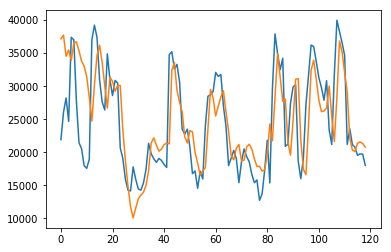

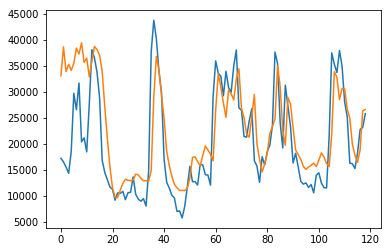

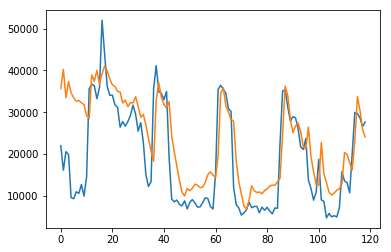

[109, 0.5638860548913679, 0.572852285197552, 0.7984544471016549, 0.9161555883259419]


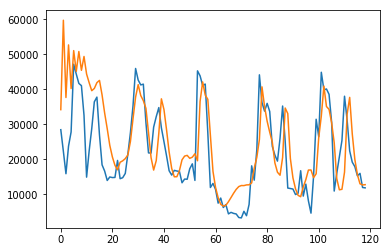

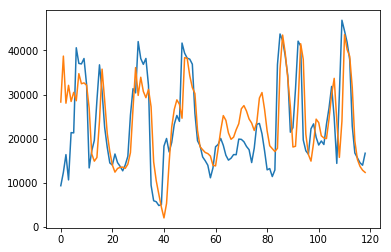

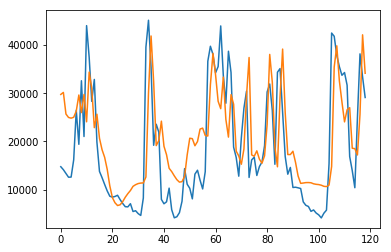

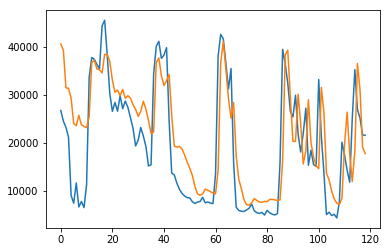

[110, 0.7253469445690017, 0.6223246726392391, 0.7348487437039871, 0.6826942348914713]


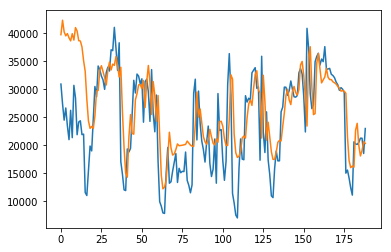

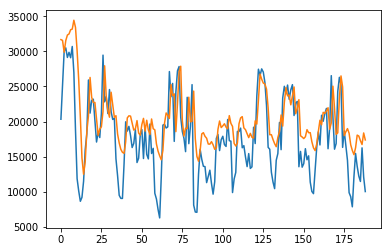

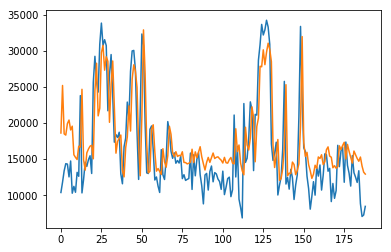

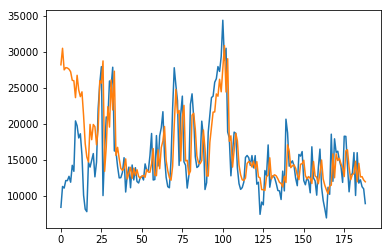

[111, 0.8628603271637355, 0.5913825397813954, 0.5487554301647227, 0.6031975865554102]


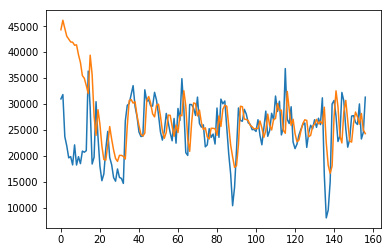

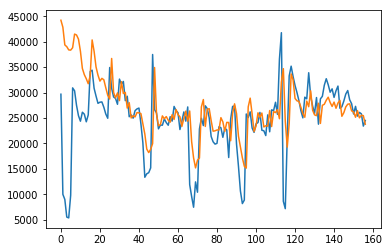

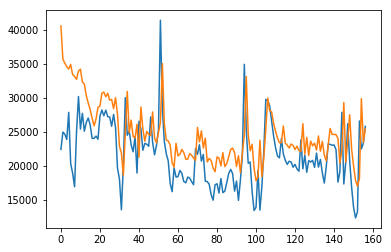

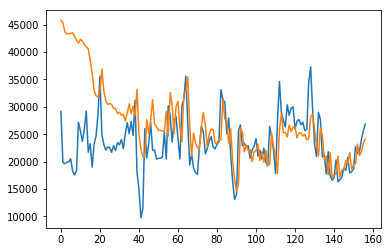

[112, 0.7642299052601081, 1.0087956781396337, 0.6850337143097129, 1.142969372768859]


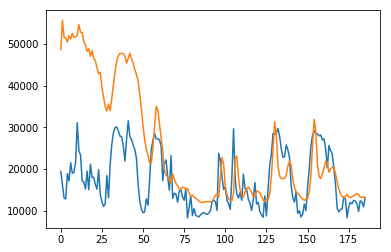

In [ ]:
i = 0
for camera_id, group in tqdm_notebook(tdf_30min.groupby("CAMERA_ID")):
    
#     series = tdf_30min.xs(level=0,key=1)["DENSITY_VALUE"]
    series = group.reset_index(level=0)["DENSITY_VALUE"]
    raw_values = series.values
    # diff_values = difference(raw_values, 1)
    # supervised = timeseries_to_supervised(diff_values, 1)
    supervised = timeseries_to_supervised(raw_values, 1)
    supervised_values = supervised.values
    
    rmses = []
    rmses_scaled = []
    

    for train_idx, test_idx in tscv.split(supervised):

        train, test = supervised_values[train_idx], supervised_values[test_idx]

        # transform the scale of the data
        scaler, train_scaled, test_scaled = scale(train, test)

        lstm_model = fit_lstm(train_scaled, 1, 20, 32)

        train_reshaped = train[:, 0].reshape(len(train), 1, 1)
        lstm_model.predict(train_reshaped, batch_size=1);

        predictions = list()

        raw_predictions = []
        for i in range(len(test_scaled)):
            # make one-step forecast
            X, y = test_scaled[i, 0:-1], test_scaled[i, -1]
            yhat = forecast_lstm(lstm_model, 1, X)

            raw_predictions.append(yhat)

            # invert scaling
            yhat = invert_scale(scaler, X, yhat)
            # invert differencing
    #         yhat = inverse_difference(raw_values, yhat, len(test_scaled)+1-i)
            # store forecast
            predictions.append(yhat)
#             expected = raw_values[len(train) + i]
    #         print('Month=%d, Predicted=%f, Expected=%f' % (i+1, yhat, expected))

        # report performance
    #     rmse = sqrt(mean_squared_error(data[-100:], predictions))
        rmse = sqrt(mean_squared_error(raw_values[test_idx], predictions))
        rmses.append(rmse)
#         print('Test RMSE: %.3f' % rmse)
        
        rmse = sqrt(mean_squared_error(test_scaled[:,-1],raw_predictions))
        rmses_scaled.append(rmse)
#         print('Test scaled RMSE: %.3f' % rmse)
        
        # line plot of observed vs predicted
        plt.plot(raw_values[test_idx])
        plt.plot(predictions)
        plt.show()
    
    print([camera_id] + rmses_scaled)
    rmse_per_cam_per_halfhour_df.loc[i] = [camera_id] + rmses
    rmse_per_cam_per_halfhour_df.to_csv("lstm_rmse_per_cam_per_halfhour_df.csv",index=False)
    rmse_scaled_per_cam_per_halfhour_df.loc[i] = [camera_id] + rmses_scaled
    rmse_scaled_per_cam_per_halfhour_df.to_csv("lstm_rmse_scaled_per_cam_per_halfhour_df.csv",index=False)
    i+=1



In [ ]:
printf("hi")